# 📌 Problem Statement
The objective of this project is to build a machine learning model that predicts customer churn for a telecommunications company. The model uses customer demographics, account details, and service usage patterns to classify whether a customer is likely to leave or stay.

Business Impact :-
By accurately identifying at-risk customers, the company can:
- Implement targeted retention strategies.
- Reduce customer loss.
- Enhance overall customer satisfaction.
- Increase long-term profitability.

#

# 📌 Data Import and Intial Exploration

IMPORTED NECCESSARY LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from matplotlib.colors import ListedColormap
%matplotlib inline
import warnings;
warnings.filterwarnings('ignore');

LOADED DATASET

In [2]:
df = pd.read_csv(r"C:\Users\Santhoshi\OneDrive\Documents\INPUT DATA\telco customer churn.csv")

In [3]:
df_original = df.copy()

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

# To display full length of columns used set_option function

In [5]:
# Data Overview
print('Dataset Shape:', df.shape)
print('-'*50)
print("\nData Types:")
print(df.info())
print('-'*50)
print("\nSample of the data:")
df.head()

Dataset Shape: (7043, 50)
--------------------------------------------------

Data Types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 50 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Under 30                           7043 non-null   object 
 4   Senior Citizen                     7043 non-null   object 
 5   Married                            7043 non-null   object 
 6   Dependents                         7043 non-null   object 
 7   Number of Dependents               7043 non-null   int64  
 8   Country                            7043 non-null   object 
 9   State                              7043 non-null   object 
 10  City                          

,Customer ID,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,City,Zip Code,Latitude,Longitude,Population,Quarter,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Customer Status,Churn Label,Churn Score,CLTV,Churn Category,Churn Reason
0,8779-QRDMV,Male,78,No,Yes,No,No,0,United States,California,Los Angeles,90022,34.023810,-118.156582,68701,Q3,No,0,1,NaN,No,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,3,Churned,Yes,91,5433,Competitor,Competitor offered more data
1,7495-OOKFY,Female,74,No,Yes,Yes,Yes,1,United States,California,Los Angeles,90063,34.044271,-118.185237,55668,Q3,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,3,Churned,Yes,69,5302,Competitor,Competitor made better offer
2,1658-BYGOY,Male,71,No,Yes,No,Yes,3,United States,California,Los Angeles,90065,34.108833,-118.229715,47534,Q3,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,2,Churned,Yes,81,3179,Competitor,Competitor made better offer
3,4598-XLKNJ,Female,78,No,Yes,Yes,Yes,1,United States,California,Inglewood,90303,33.936291,-118.332639,27778,Q3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07,2,Churned,Yes,88,5337,Dissatisfaction,Limited range of services
4,4846-WHAFZ,Female,80,No,Yes,Yes,Yes,1,United States,California,Whittier,90602,33.972119,-118.020188,26265,Q3,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36,2,Churned,Yes,67,2793,Price,Extra data charges


In [6]:
df.columns = df.columns.str.replace(' ', '_')

In [7]:
print(df.columns.tolist())

['Customer_ID', 'Gender', 'Age', 'Under_30', 'Senior_Citizen', 'Married', 'Dependents', 'Number_of_Dependents', 'Country', 'State', 'City', 'Zip_Code', 'Latitude', 'Longitude', 'Population', 'Quarter', 'Referred_a_Friend', 'Number_of_Referrals', 'Tenure_in_Months', 'Offer', 'Phone_Service', 'Avg_Monthly_Long_Distance_Charges', 'Multiple_Lines', 'Internet_Service', 'Internet_Type', 'Avg_Monthly_GB_Download', 'Online_Security', 'Online_Backup', 'Device_Protection_Plan', 'Premium_Tech_Support', 'Streaming_TV', 'Streaming_Movies', 'Streaming_Music', 'Unlimited_Data', 'Contract', 'Paperless_Billing', 'Payment_Method', 'Monthly_Charge', 'Total_Charges', 'Total_Refunds', 'Total_Extra_Data_Charges', 'Total_Long_Distance_Charges', 'Total_Revenue', 'Satisfaction_Score', 'Customer_Status', 'Churn_Label', 'Churn_Score', 'CLTV', 'Churn_Category', 'Churn_Reason']


In [8]:
df.rename(columns = {'Customer_ID' : 'cust_id',  
                     'Senior_Citizen': 'sr_citizen',
                     'Number_of_Dependents': 'depend_count',
                     'Zip_Code' : 'zip_code',
                     'Referred_a_Friend': 'referals',
                     'Number_of_Referrals': 'referals_num',
                     'Tenure_in_Months': 'tenure_m',
                     'Phone_Service' : 'ph_ser',
                     'Avg_Monthly_Long Distance Charges': 'avg_mon_ld_chg',
                     'Multiple_Lines': 'multi_line',
                     'Internet_Service': 'internet_ser',
                     'Internet_Type': 'internet_type',
                     'Avg_Monthly_GB Download': 'avg_mo_gb_dwn',
                     'Online_Security': 'online_security',
                     'Device_Protection_Plan': 'device_pro_plan',
                     'Premium_Tech_Support': 'prem_tech_supp',
                      'Total_Extra_Data_Charges': 'tot_extra_data_charges',
                     'Total_Long_Distance_Charges': 'tot_long_dist_charges'}, inplace = True)

In [9]:
# check for unique values of all columns
for col in df.columns:
    print(col, df[col].unique())
    print('-'*50)

cust_id ['8779-QRDMV' '7495-OOKFY' '1658-BYGOY' ... '2234-XADUH' '4801-JZAZL'
 '3186-AJIEK']
--------------------------------------------------
Gender ['Male' 'Female']
--------------------------------------------------
Age [78 74 71 80 72 76 66 70 77 65 67 68 69 79 75 73 37 19 31 23 38 21 29 61
 27 20 56 51 48 32 34 41 30 26 62 64 45 53 63 42 24 54 39 43 50 22 40 47
 60 52 55 59 49 58 25 28 33 44 57 46 36 35]
--------------------------------------------------
Under_30 ['No' 'Yes']
--------------------------------------------------
sr_citizen ['Yes' 'No']
--------------------------------------------------
Married ['No' 'Yes']
--------------------------------------------------
Dependents ['No' 'Yes']
--------------------------------------------------
depend_count [0 1 3 2 5 4 6 7 8 9]
--------------------------------------------------
Country ['United States']
--------------------------------------------------
State ['California']
--------------------------------------------------
City 

In [10]:
col = ['Churn_Category', 'Churn_Reason']
for x in col:
    print(df[x].unique())

# comparing values between 'Churn_Category' and 'Churn_Reason' columns

['Competitor' 'Dissatisfaction' 'Price' 'Other' 'Attitude' nan]
['Competitor offered more data' 'Competitor made better offer'
 'Limited range of services' 'Extra data charges'
 'Competitor had better devices' "Don't know" 'Service dissatisfaction'
 'Lack of affordable download/upload speed' 'Product dissatisfaction'
 'Long distance charges' 'Poor expertise of online support'
 'Attitude of support person' 'Network reliability'
 'Competitor offered higher download speeds' 'Moved' 'Price too high'
 'Attitude of service provider' 'Poor expertise of phone support'
 'Deceased' nan 'Lack of self-service on Website']


#

### Dropping Uneccessary columns

 dropping columns -> dependents(because as there is already 'depend_count' column which gives number of dependents), zip_code, latitude, longtitude, referals(as there is already referals_num
                     column is there)

In [11]:
df.drop(columns = ['cust_id', 'Dependents', 'zip_code', 'Latitude', 'Longitude', 'referals', 'Churn_Category' ], inplace = True)

In [12]:
df.shape

(7043, 43)

#

### Checking and Correcting the datatypes of columns

In [13]:
df.head(3)

,Gender,Age,Under_30,sr_citizen,Married,depend_count,Country,State,City,Population,Quarter,referals_num,tenure_m,Offer,ph_ser,Avg_Monthly_Long_Distance_Charges,multi_line,internet_ser,internet_type,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Contract,Paperless_Billing,Payment_Method,Monthly_Charge,Total_Charges,Total_Refunds,tot_extra_data_charges,tot_long_dist_charges,Total_Revenue,Satisfaction_Score,Customer_Status,Churn_Label,Churn_Score,CLTV,Churn_Reason
0,Male,78,No,Yes,No,0,United States,California,Los Angeles,68701,Q3,0,1,NaN,No,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,3,Churned,Yes,91,5433,Competitor offered more data
1,Female,74,No,Yes,Yes,1,United States,California,Los Angeles,55668,Q3,1,8,Offer E,Yes,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,3,Churned,Yes,69,5302,Competitor made better offer
2,Male,71,No,Yes,No,3,United States,California,Los Angeles,47534,Q3,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,2,Churned,Yes,81,3179,Competitor made better offer


In [14]:
print(df.dtypes)

Gender                                object
Age                                    int64
Under_30                              object
sr_citizen                            object
Married                               object
depend_count                           int64
Country                               object
State                                 object
City                                  object
Population                             int64
Quarter                               object
referals_num                           int64
tenure_m                               int64
Offer                                 object
ph_ser                                object
Avg_Monthly_Long_Distance_Charges    float64
multi_line                            object
internet_ser                          object
internet_type                         object
Avg_Monthly_GB_Download                int64
online_security                       object
Online_Backup                         object
device_pro

#

# 📌 Explorataory Data Analysis and Insights

### Check for duplicate values

In [15]:
print(df.duplicated().sum())

0


### Check for Missing Values

In [16]:
df.isnull().sum()

Gender                                  0
Age                                     0
Under_30                                0
sr_citizen                              0
Married                                 0
depend_count                            0
Country                                 0
State                                   0
City                                    0
Population                              0
Quarter                                 0
referals_num                            0
tenure_m                                0
Offer                                3877
ph_ser                                  0
Avg_Monthly_Long_Distance_Charges       0
multi_line                              0
internet_ser                            0
internet_type                        1526
Avg_Monthly_GB_Download                 0
online_security                         0
Online_Backup                           0
device_pro_plan                         0
prem_tech_supp                    

### Percentage calculation of null values

In [17]:
df.isnull().sum()*100/df.shape[0]

Gender                                0.000000
Age                                   0.000000
Under_30                              0.000000
sr_citizen                            0.000000
Married                               0.000000
depend_count                          0.000000
Country                               0.000000
State                                 0.000000
City                                  0.000000
Population                            0.000000
Quarter                               0.000000
referals_num                          0.000000
tenure_m                              0.000000
Offer                                55.047565
ph_ser                                0.000000
Avg_Monthly_Long_Distance_Charges     0.000000
multi_line                            0.000000
internet_ser                          0.000000
internet_type                        21.666903
Avg_Monthly_GB_Download               0.000000
online_security                       0.000000
Online_Backup

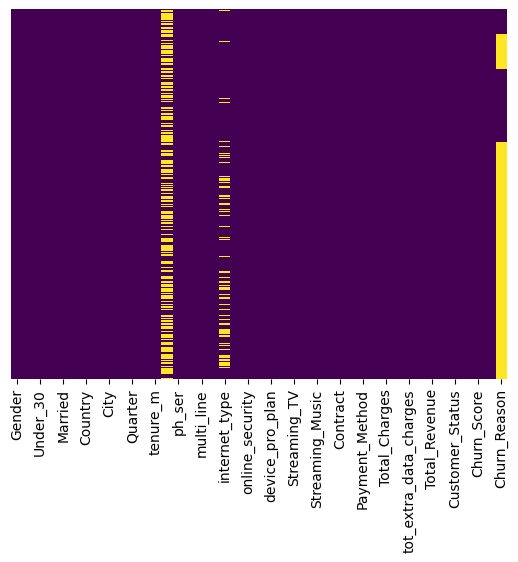

In [18]:
sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap = 'viridis')
plt.show()

### Column Split for Analysis

In [19]:
cat_col = df.select_dtypes(include = ['object', 'category']).copy()
numeric_col = df.select_dtypes(include = ['int64', 'float64']).copy()

In [20]:
print(cat_col.columns)

Index(['Gender', 'Under_30', 'sr_citizen', 'Married', 'Country', 'State',
       'City', 'Quarter', 'Offer', 'ph_ser', 'multi_line', 'internet_ser',
       'internet_type', 'online_security', 'Online_Backup', 'device_pro_plan',
       'prem_tech_supp', 'Streaming_TV', 'Streaming_Movies', 'Streaming_Music',
       'Unlimited_Data', 'Contract', 'Paperless_Billing', 'Payment_Method',
       'Customer_Status', 'Churn_Label', 'Churn_Reason'],
      dtype='object')


In [21]:
print(numeric_col.columns)

Index(['Age', 'depend_count', 'Population', 'referals_num', 'tenure_m',
       'Avg_Monthly_Long_Distance_Charges', 'Avg_Monthly_GB_Download',
       'Monthly_Charge', 'Total_Charges', 'Total_Refunds',
       'tot_extra_data_charges', 'tot_long_dist_charges', 'Total_Revenue',
       'Satisfaction_Score', 'Churn_Score', 'CLTV'],
      dtype='object')


### Intial EDA (feature-level)

We start by visualizing the full dataset to get an initial understanding of the numerical and categorical features, identifying any missing values or outliers

#### Visualization for Numerical Columns

Age: mean=46.50972596904728, median=46.0, mode=42


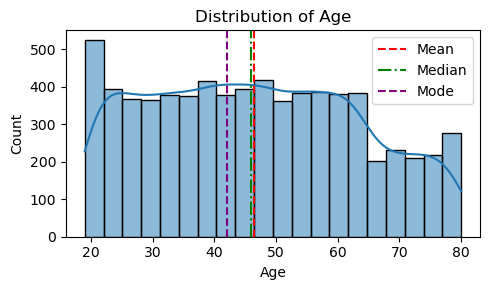

depend_count: mean=0.4686923186142269, median=0.0, mode=0


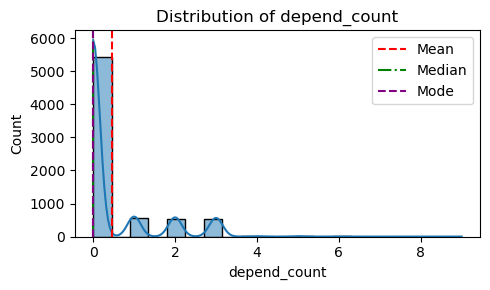

Population: mean=22139.60329405083, median=17554.0, mode=42239


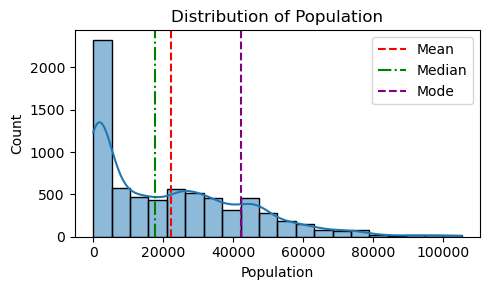

referals_num: mean=1.9518671020871787, median=0.0, mode=0


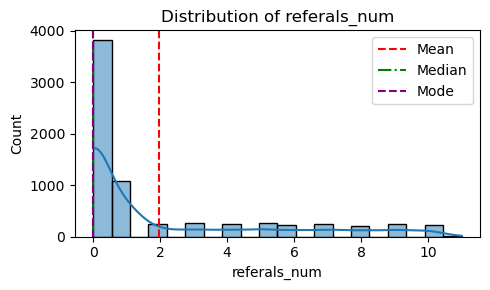

tenure_m: mean=32.38676700269772, median=29.0, mode=1


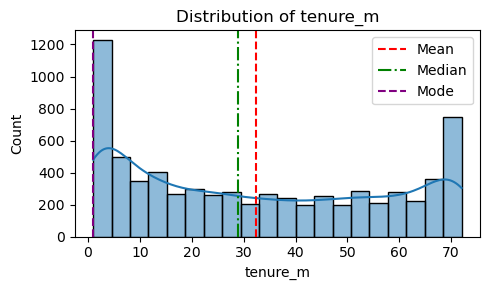

Avg_Monthly_Long_Distance_Charges: mean=22.958953570921484, median=22.89, mode=0.0


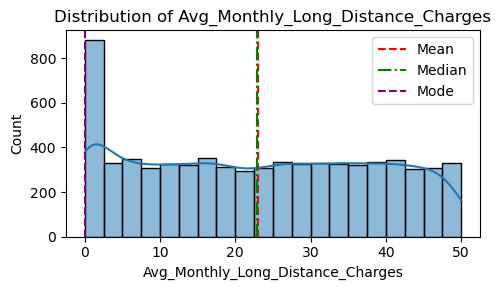

Avg_Monthly_GB_Download: mean=20.515405367031093, median=17.0, mode=0


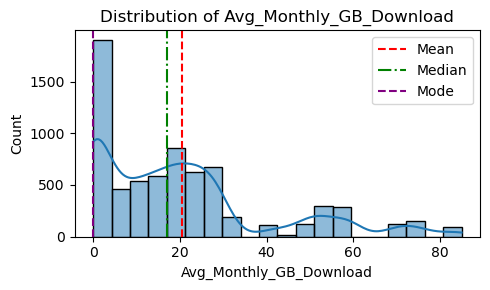

Monthly_Charge: mean=64.76169246059918, median=70.35, mode=20.05


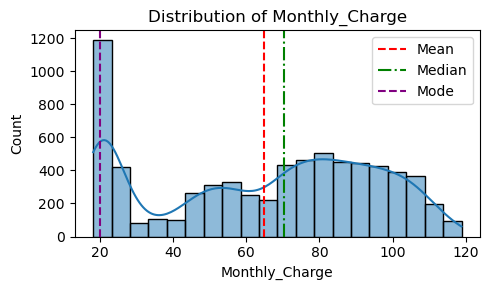

Total_Charges: mean=2280.3812636660514, median=1394.55, mode=20.2


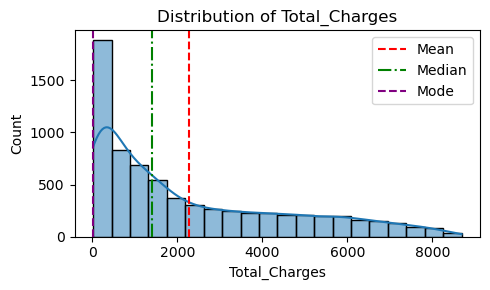

Total_Refunds: mean=1.9621823086752805, median=0.0, mode=0.0


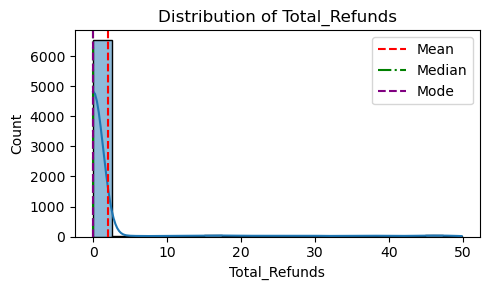

tot_extra_data_charges: mean=6.860712764446968, median=0.0, mode=0


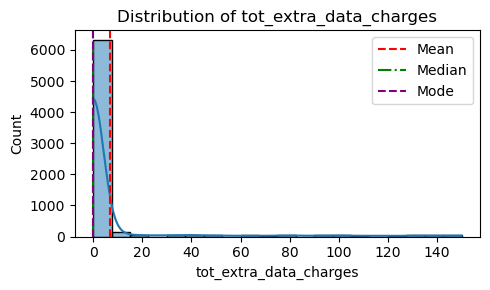

tot_long_dist_charges: mean=749.099261678262, median=401.44, mode=0.0


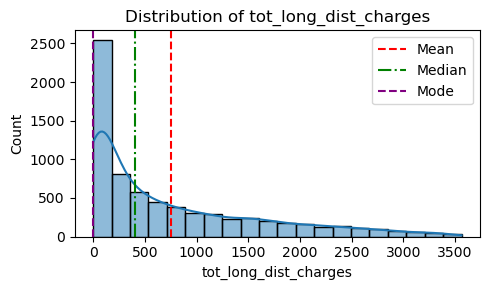

Total_Revenue: mean=3034.3790558000846, median=2108.64, mode=24.8


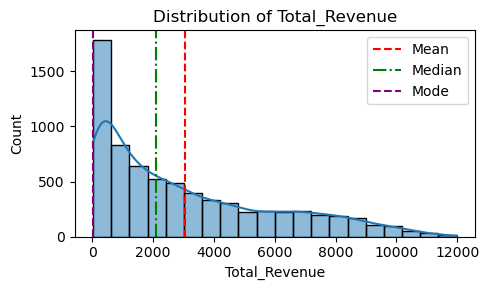

Satisfaction_Score: mean=3.2449240380519666, median=3.0, mode=3


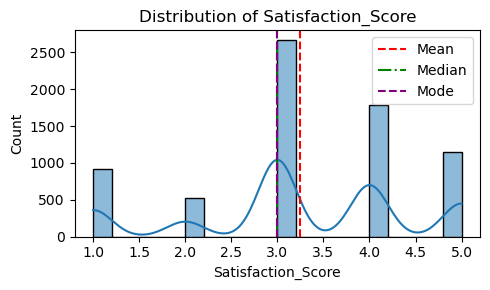

Churn_Score: mean=58.505040465710636, median=61.0, mode=91


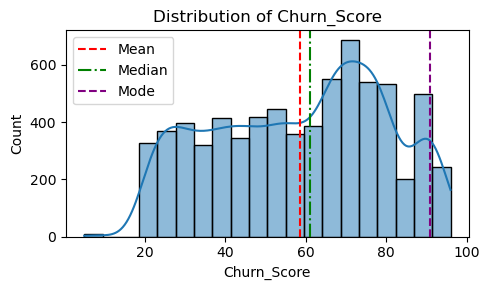

CLTV: mean=4400.295754650007, median=4527.0, mode=5546


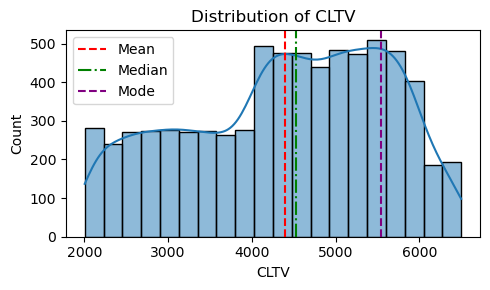

In [22]:
def plot_histogram(numeric_col, col):
    plt.figure(figsize=(5,3))
    sns.histplot(numeric_col[col], bins=20, kde=True)
    plt.title(f"Distribution of {col}")
    
    col_mean = numeric_col[col].mean()
    col_median = numeric_col[col].median()
    col_mode_series = numeric_col[col].mode()
    col_mode = col_mode_series[0] if not col_mode_series.empty else None
    
    print(f"{col}: mean={col_mean}, median={col_median}, mode={col_mode}")  
    
    if pd.notna(col_mean):
        plt.axvline(col_mean, color='red', linestyle='--', label='Mean')
    if pd.notna(col_median):
        plt.axvline(col_median, color='green', linestyle='-.', label='Median')
    if col_mode is not None and pd.notna(col_mode):
        plt.axvline(col_mode, color='purple', linestyle='--', label='Mode')
    
    plt.legend()
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

for col in numeric_col.columns:
    plot_histogram(numeric_col, col)


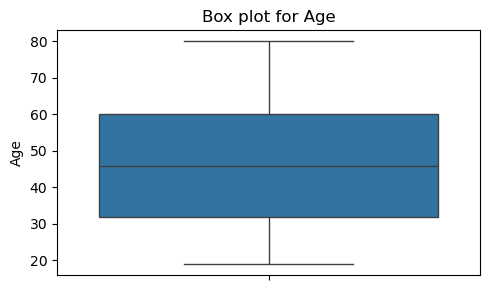

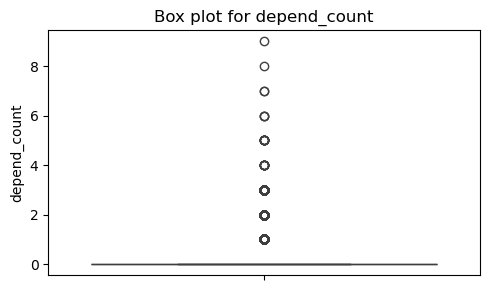

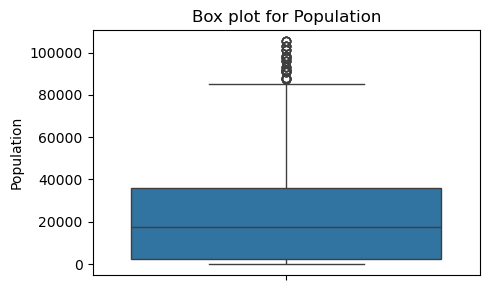

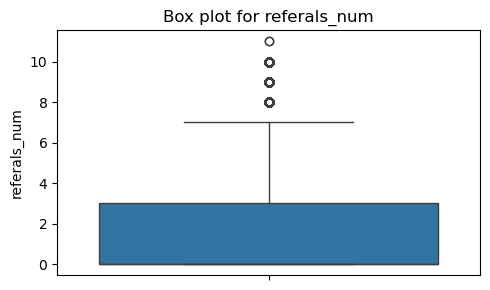

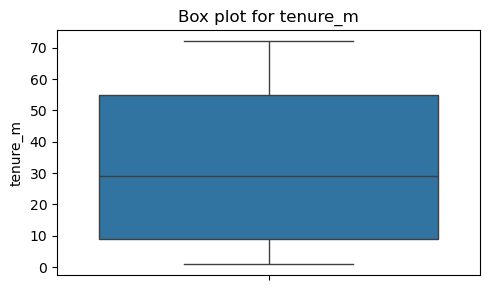

...

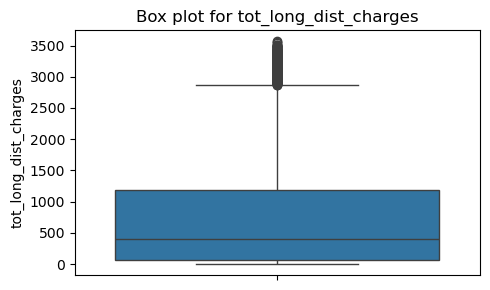

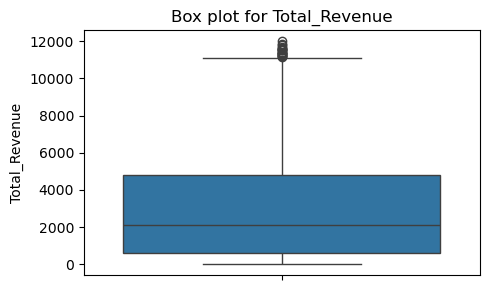

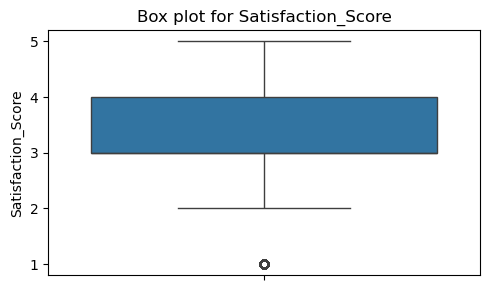

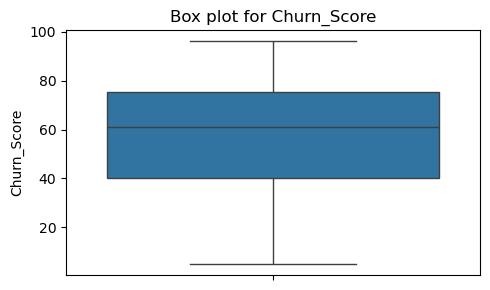

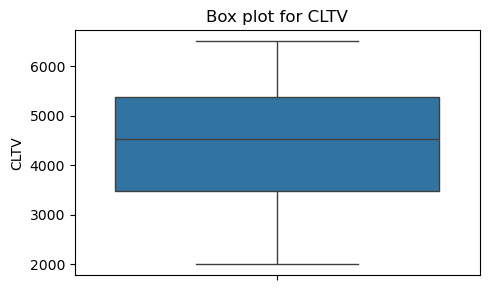

In [23]:
def plot_boxplot(numeric_col, col):
    plt.figure(figsize = (5,3))
    sns.boxplot(data = numeric_col[col])
    plt.title(f'Box plot for {col}')
    plt.tight_layout()
    plt.show()

for col in numeric_col.columns:
    plot_boxplot(numeric_col, col)

#### Visualization for Categorical Columns

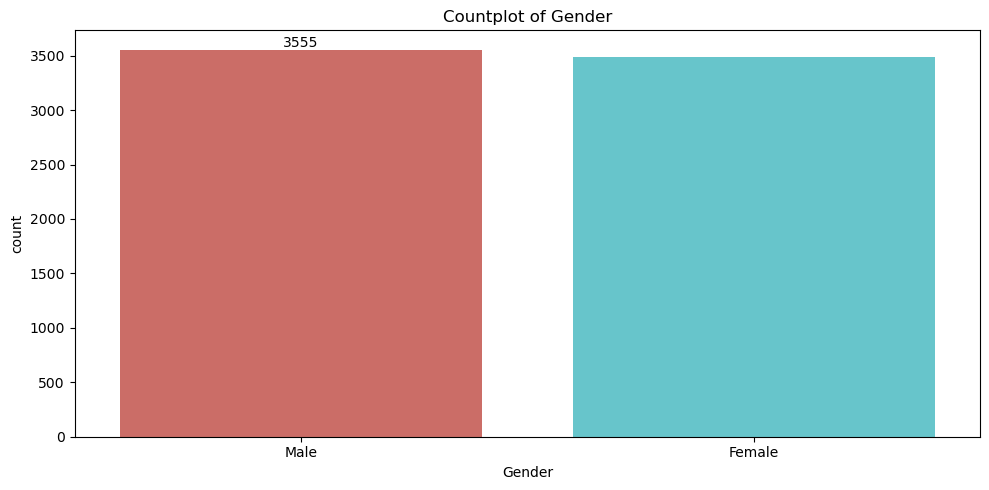

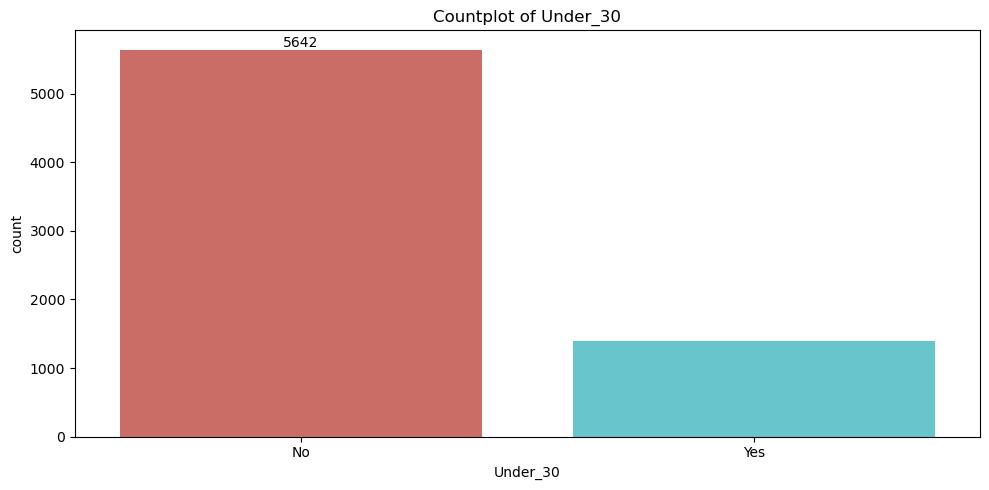

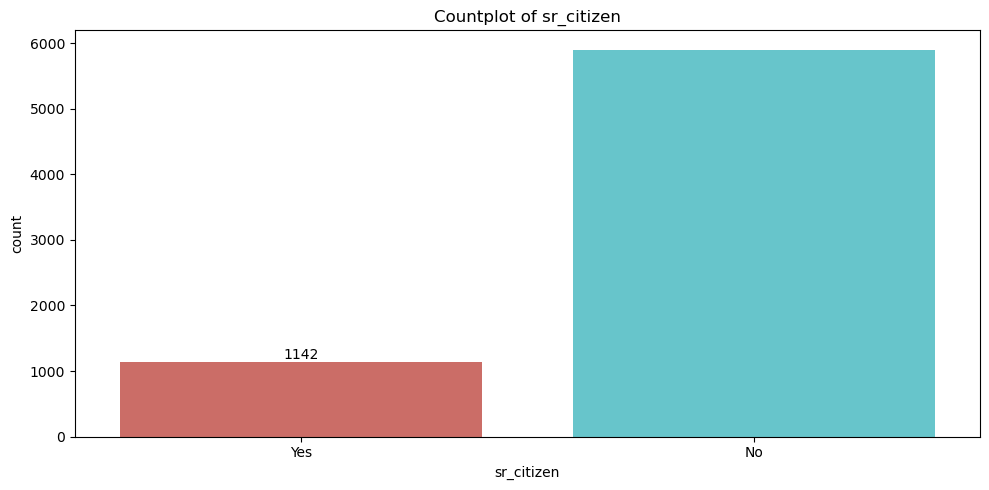

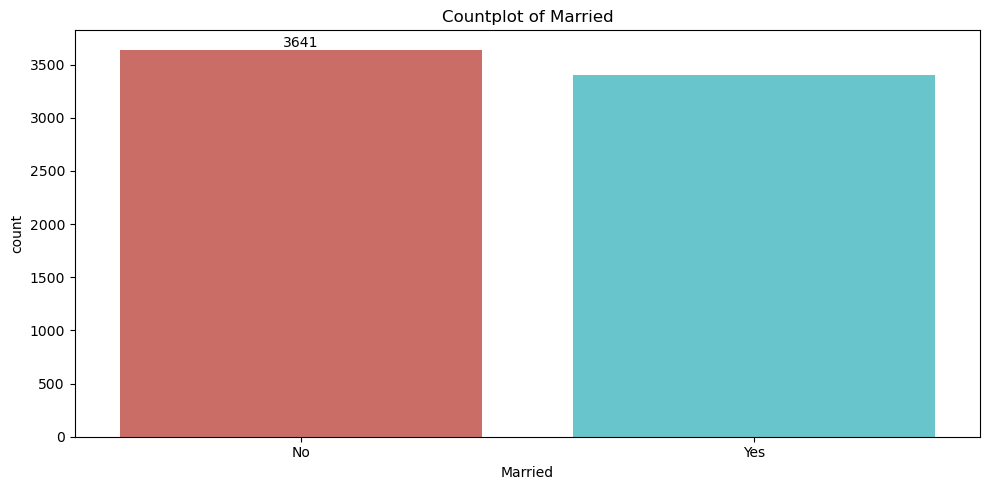

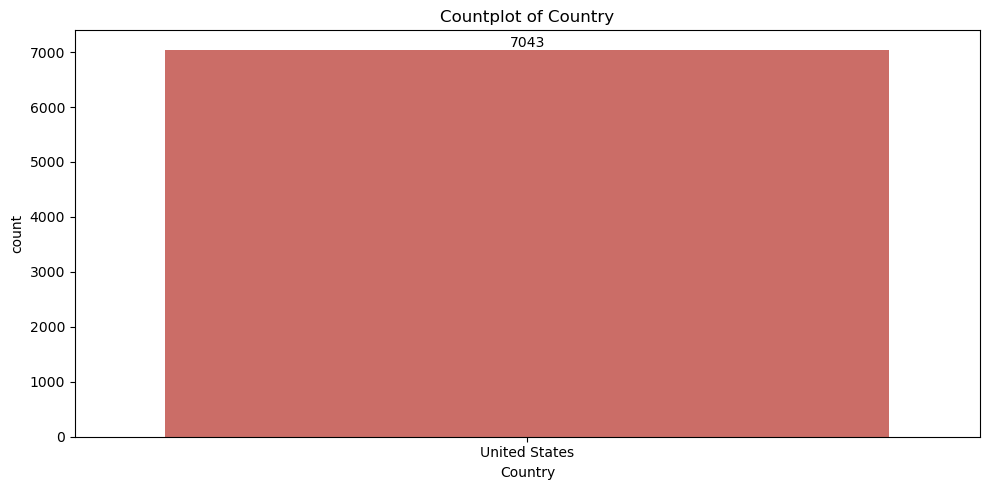

...

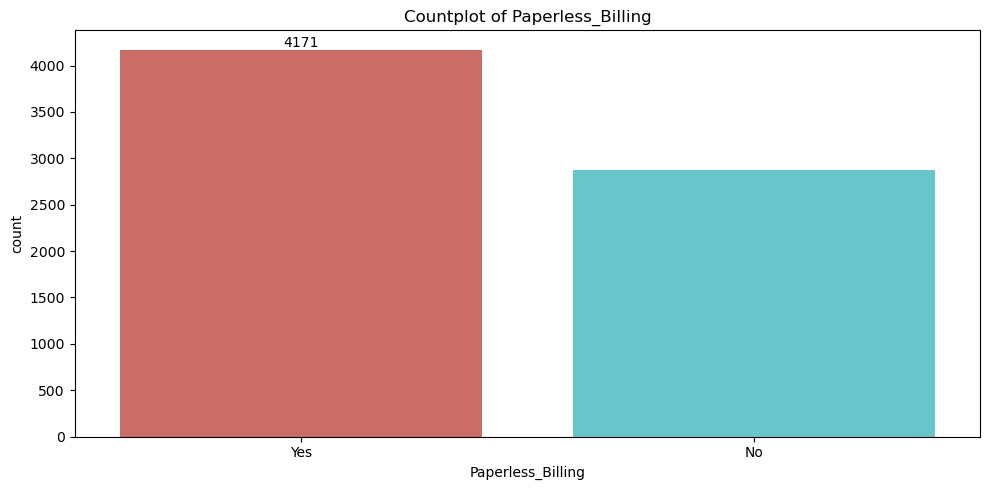

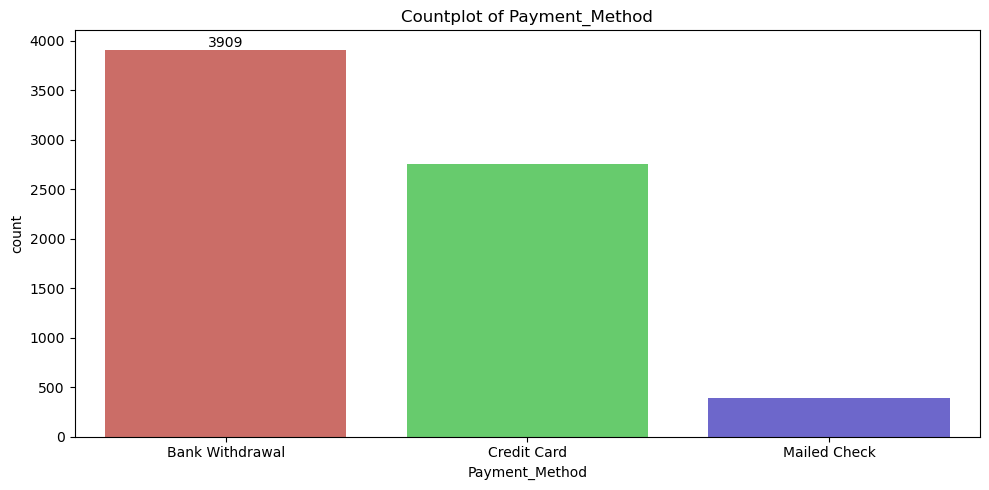

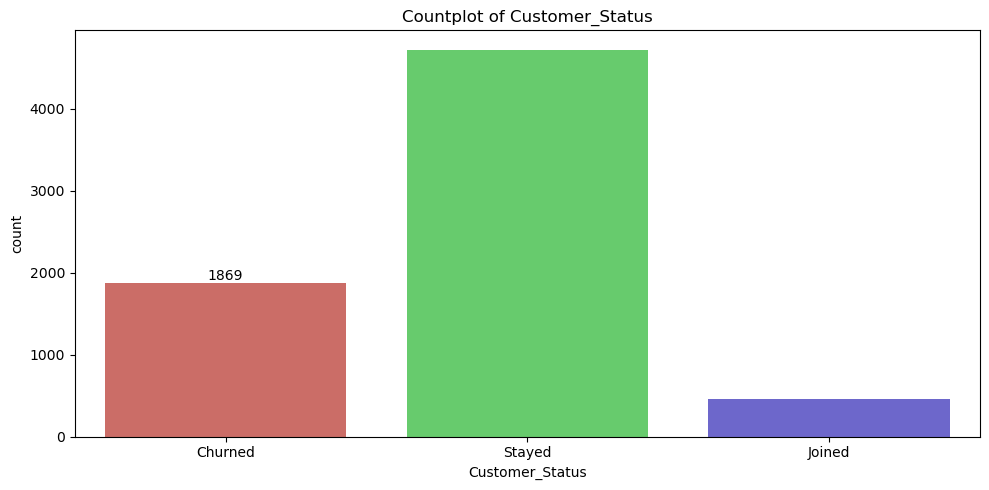

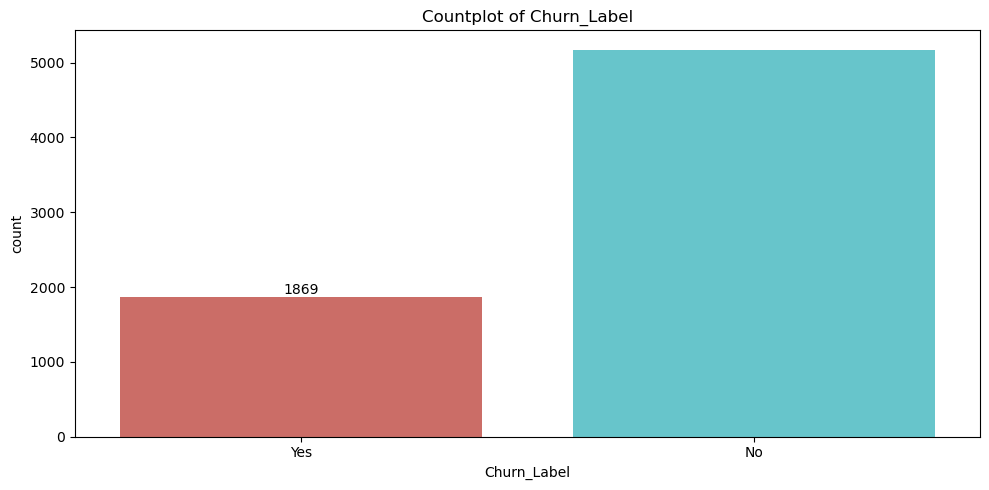

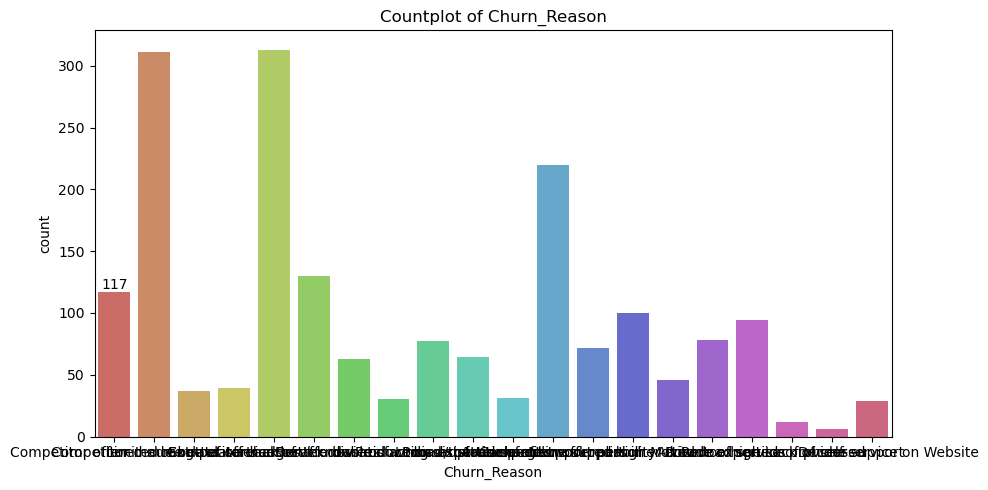

In [24]:
for col in cat_col:
    plt.figure(figsize = (10,5))
    ax = sns.countplot(x = col, data = cat_col, palette = 'hls')
    ax.bar_label(ax.containers[0])
    plt.title(f'Countplot of {col}')
    plt.tight_layout()
    plt.show()

#

### Multicollinearity Check

#### Heatmap for all numerical columns

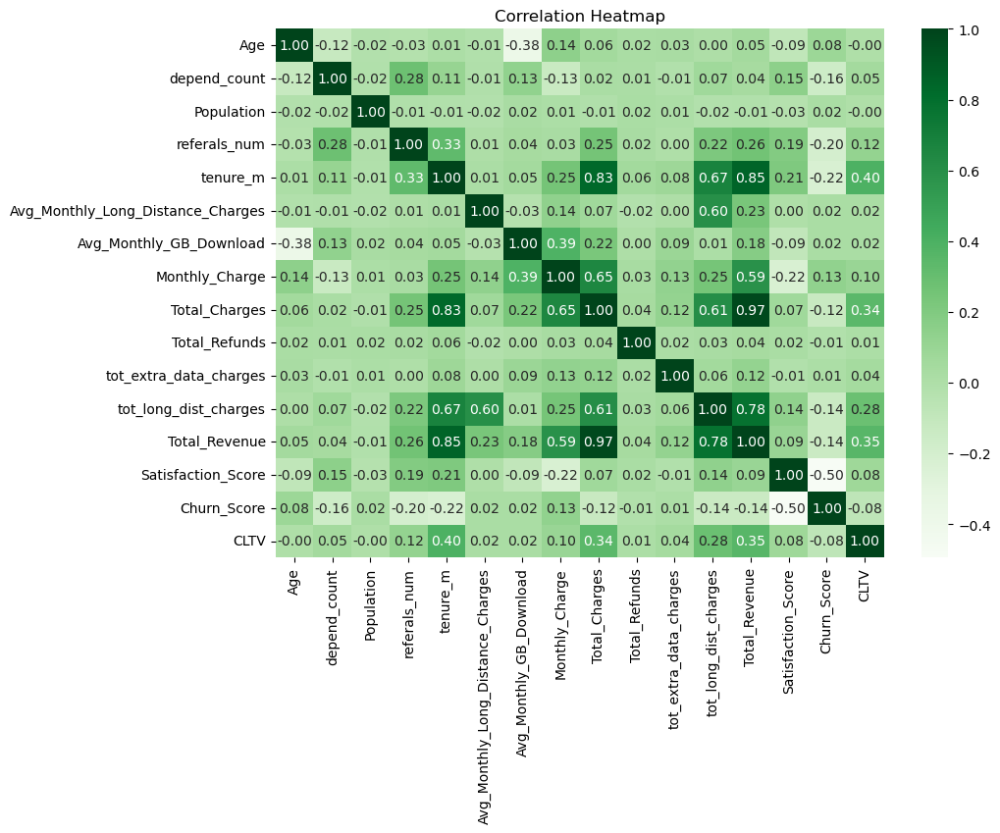

In [25]:
plt.figure(figsize = (10, 7))
sns.heatmap(numeric_col.corr(), annot = True, cmap = "Greens", fmt = ".2f")
plt.title("Correlation Heatmap")
plt.show()

#

## Feature-Target Relationship Analysis

#### Feature Relevance and Predictive Power Analysis

##### Using t-test

In [26]:
from scipy.stats import ttest_ind

# for storing results
t_results = []  

for col in numeric_col:
    group0 = df[df['Churn_Label'] == "No"][col].dropna()  # Class0
    group1 = df[df['Churn_Label'] == "Yes"][col].dropna()  # Class1
    
    # Perform Independent t-test
    t_stat, p_val = ttest_ind(group0, group1)

    # check Significance
    significance = "Significant (p<0.05)" if p_val < 0.05 else "Not Significant"

    # Save results
    t_results.append([col, t_stat, p_val, significance])

# Convert to dataframe
t_df = pd.DataFrame(t_results, columns=['Feature', 'T_statistic', 'p-value', 'Significance'])

# Sort by p-value
t_df = t_df.sort_values(by='p-value')

print(t_df) 

                              Feature  T_statistic        p-value  \
13                 Satisfaction_Score    96.510190   0.000000e+00   
14                        Churn_Score   -73.869959   0.000000e+00   
4                            tenure_m    31.644317  1.329222e-205   
3                        referals_num    25.096129  3.406199e-133   
11              tot_long_dist_charges    19.263927   1.247019e-80   
12                      Total_Revenue    19.195704   4.351662e-80   
1                        depend_count    18.813771   4.420027e-77   
8                       Total_Charges    16.998549   1.538899e-63   
7                      Monthly_Charge   -16.536738   2.706646e-60   
15                               CLTV    10.783471   6.679131e-27   
0                                 Age    -9.779220   1.920497e-22   
2                          Population    -4.339713   1.446634e-05   
6             Avg_Monthly_GB_Download    -4.105414   4.081545e-05   
9                       Total_Refu

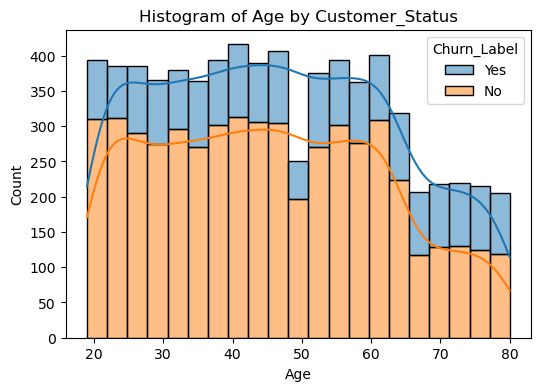

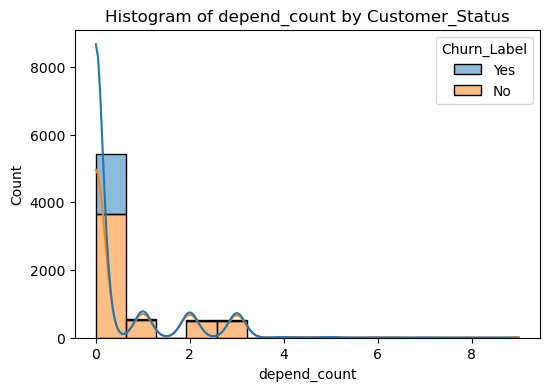

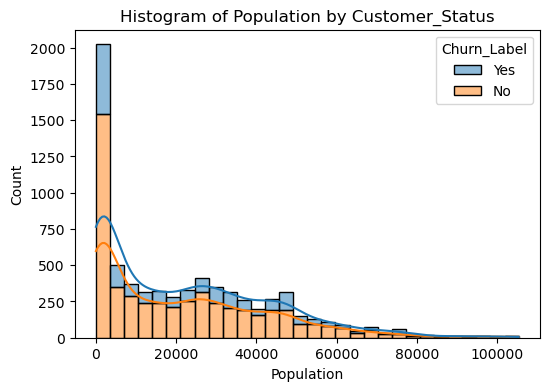

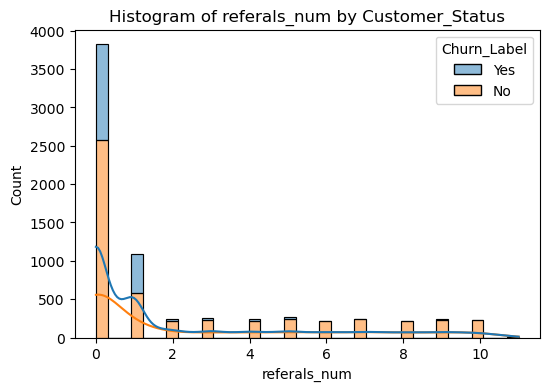

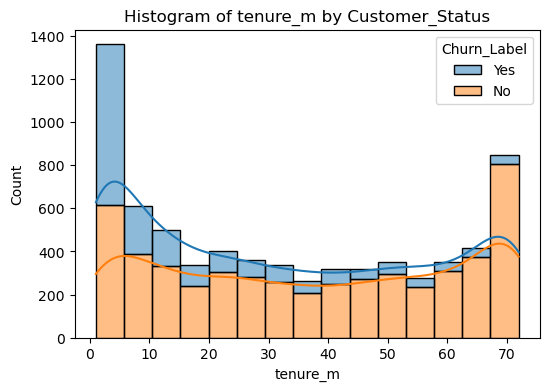

...

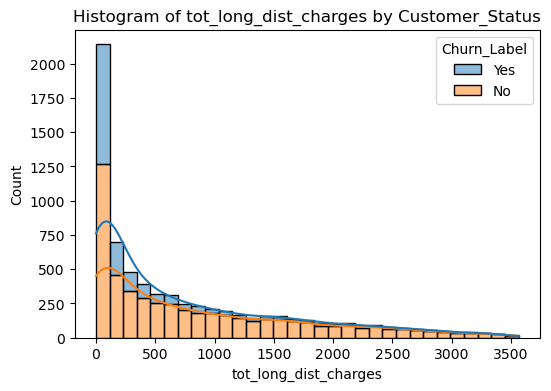

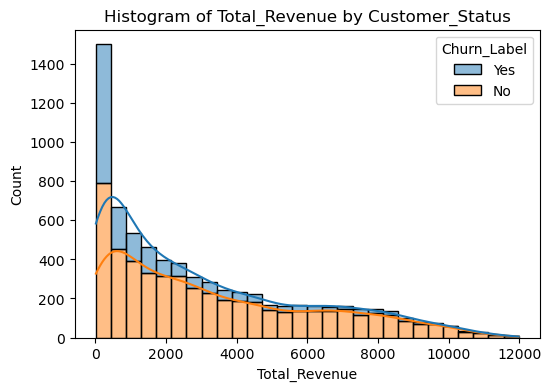

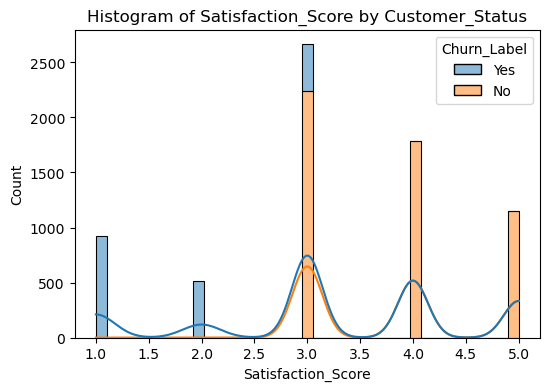

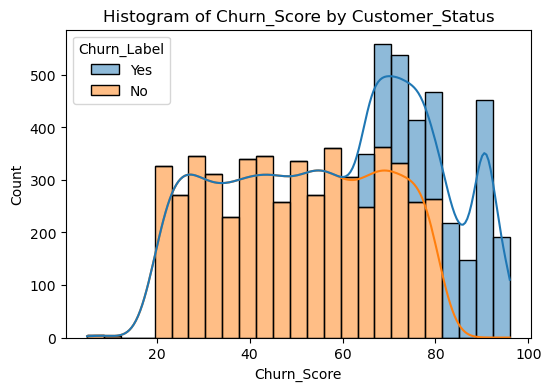

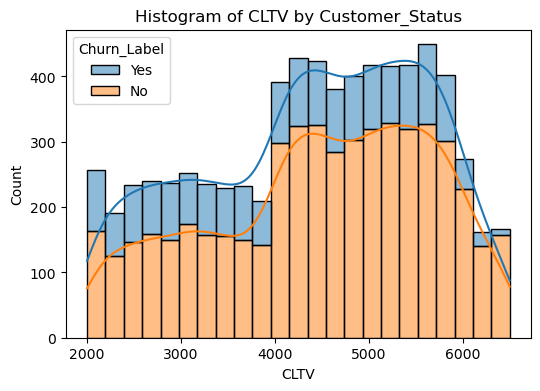

In [27]:
for col in numeric_col:
    plt.figure(figsize = (6,4))
    sns.histplot(data = df, x = col, hue = 'Churn_Label', kde = True, multiple = 'stack')
    plt.title(f'Histogram of {col} by Customer_Status')
    plt.show()

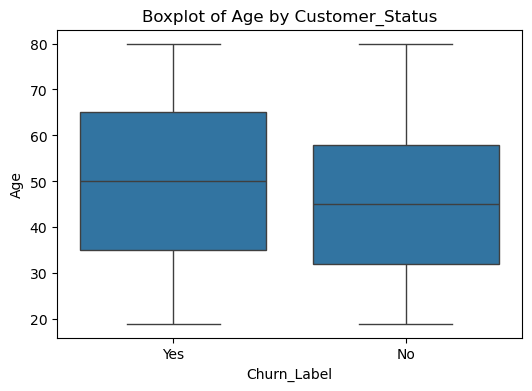

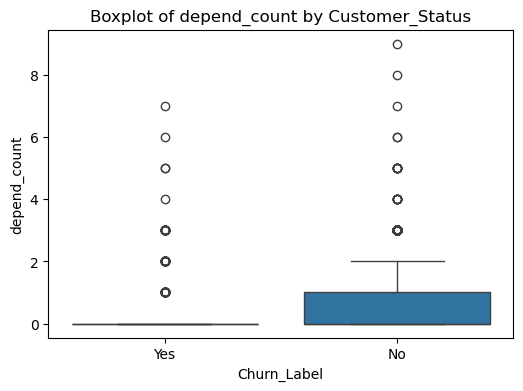

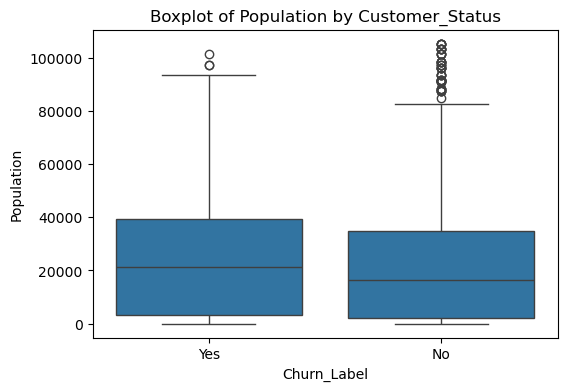

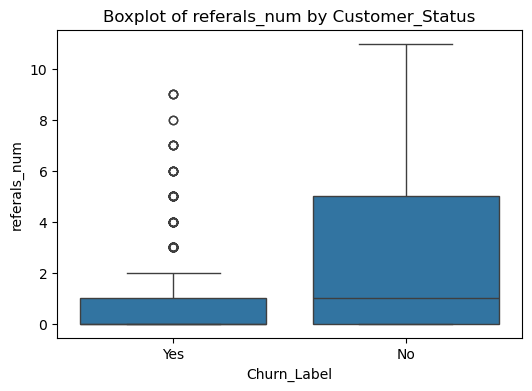

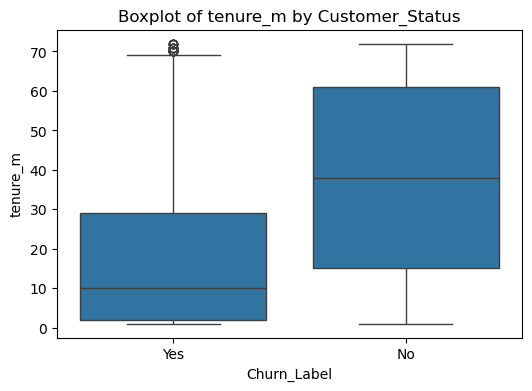

...

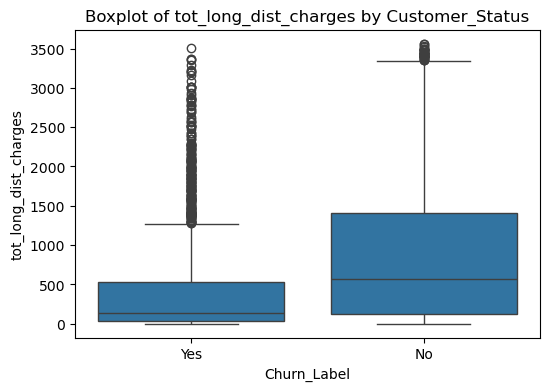

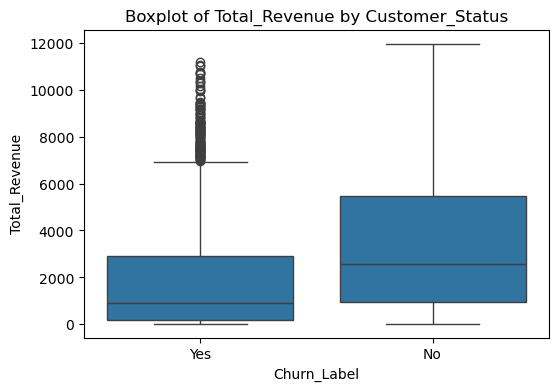

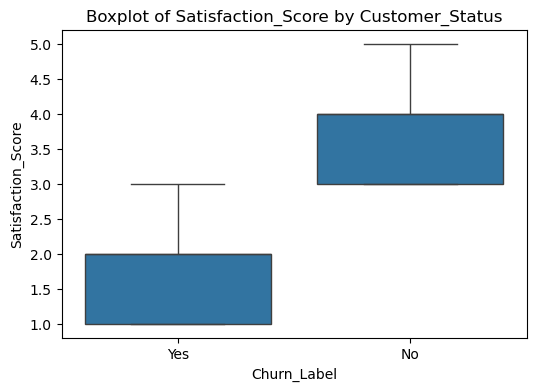

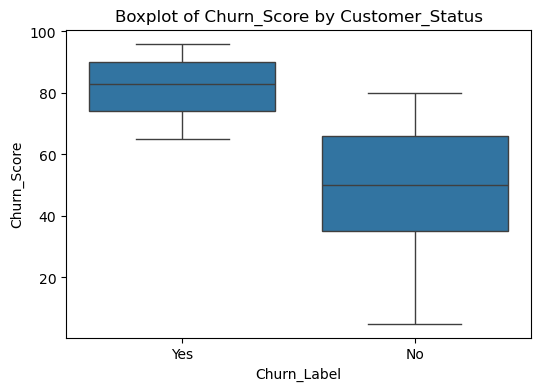

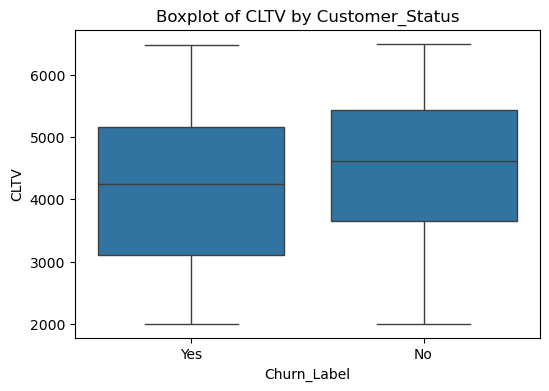

In [28]:
for col in numeric_col:
    plt.figure(figsize=(6,4))
    sns.boxplot(x="Churn_Label", y=col, data=df)
    plt.title(f"Boxplot of {col} by Customer_Status")
    plt.show()


#

#### Feature Relevance and Predictive Power analysis between categorical features and Categoricat Target

#### Using chi-square test

In [29]:
from scipy.stats import chi2_contingency


chi2_results = []

for col in cat_col:
    ct = pd.crosstab(df[col], df['Churn_Label'])   # create contingency table
    chi2, p, dof, expected = chi2_contingency(ct)    # run chi-square test
    significance = 'Significant (p < 0.05)' if p<0.05 else 'not significant'   #Significance check

    chi2_results.append([col, chi2, p, dof, significance])

chi2_df = pd.DataFrame(chi2_results, columns = ['Feature', 'chi2-stat', 'p-value', 'DOF', 'Significance'])
print(chi2_df.sort_values(by='p-value'))  

              Feature    chi2-stat        p-value   DOF  \
24    Customer_Status  7043.000000   0.000000e+00     2   
25        Churn_Label  7037.871379   0.000000e+00     1   
21           Contract  1445.293243   0.000000e+00     2   
8               Offer   488.635809  1.922257e-104     4   
11       internet_ser   364.519799   2.920300e-81     1   
23     Payment_Method   337.831161   4.374168e-74     2   
22  Paperless_Billing   258.277649   4.073355e-58     1   
12      internet_type   258.810664   6.309258e-57     2   
13    online_security   205.633104   1.232098e-46     1   
20     Unlimited_Data   194.549217   3.231434e-44     1   
16     prem_tech_supp   190.166842   2.923567e-43     1   
2          sr_citizen   159.426300   1.510067e-36     1   
3             Married   158.733382   2.139911e-36     1   
14      Online_Backup    47.260854   6.214093e-12     1   
6                City  1382.693270   2.032629e-08  1105   
15    device_pro_plan    30.513395   3.315693e-08     1 

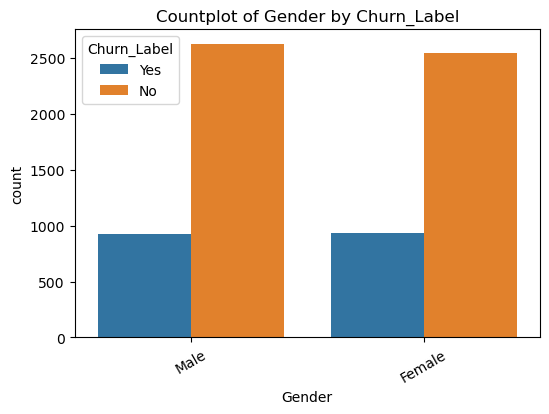

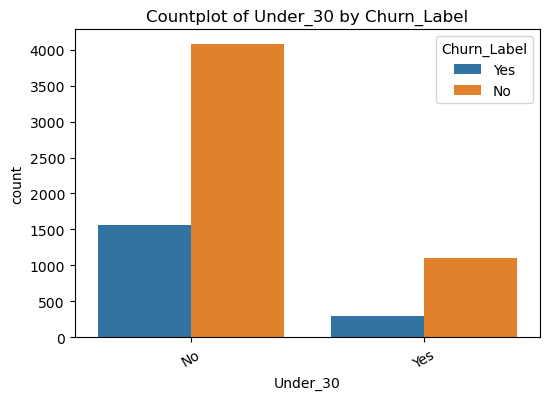

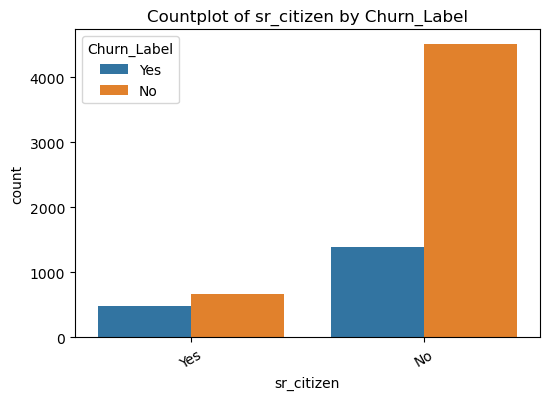

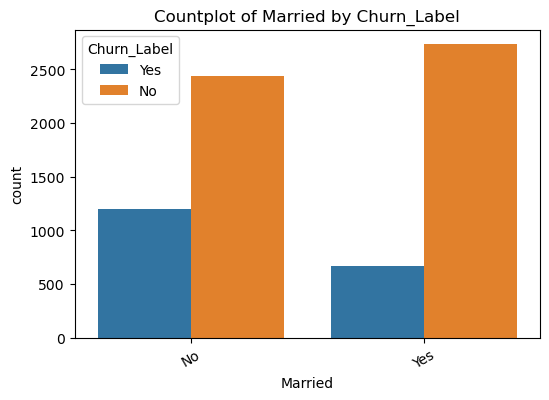

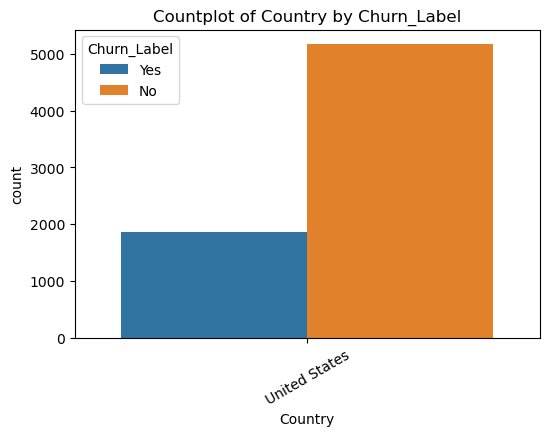

...

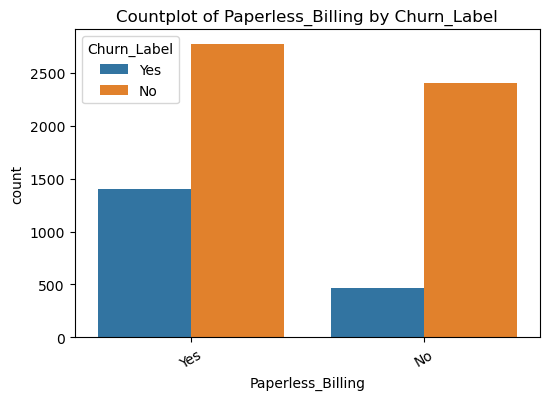

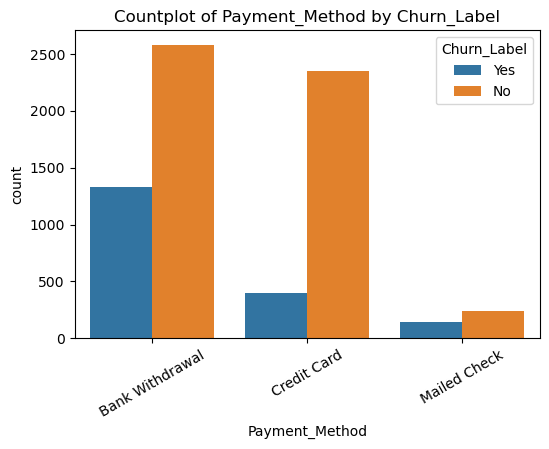

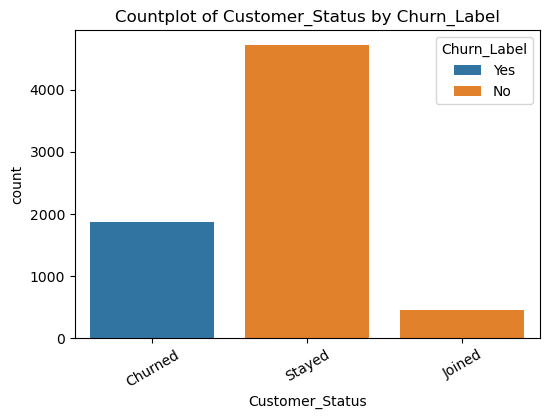

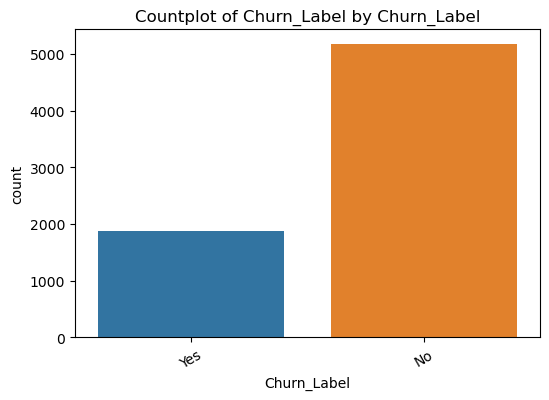

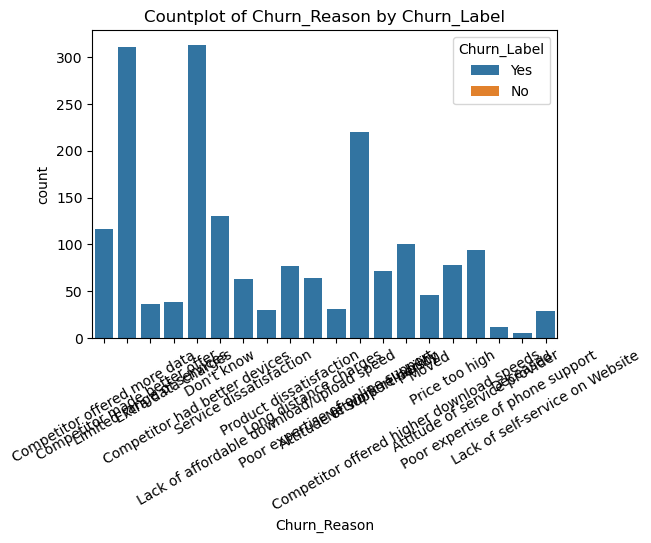

In [30]:
for col in cat_col:
    plt.figure(figsize = (6,4))
    sns.countplot(x = col, hue = 'Churn_Label', data = df)
    plt.title(f'Countplot of {col} by Churn_Label')
    plt.xticks(rotation = 30)
    plt.show()

# 📌EDA and Insights:


### "Based on these insights recommended targeted improvements to reduce churn by addressing the top reasons customers leave"

In [31]:
df['Churn_Reason'].value_counts()

Churn_Reason
Competitor had better devices                313
Competitor made better offer                 311
Attitude of support person                   220
Don't know                                   130
Competitor offered more data                 117
Competitor offered higher download speeds    100
Attitude of service provider                  94
Price too high                                78
Product dissatisfaction                       77
Network reliability                           72
Long distance charges                         64
Service dissatisfaction                       63
Moved                                         46
Extra data charges                            39
Limited range of services                     37
Poor expertise of online support              31
Lack of affordable download/upload speed      30
Lack of self-service on Website               29
Poor expertise of phone support               12
Deceased                                       6
Name: c

In [32]:
data = {'Top Churn_Reasons' : ['Competitor had better devices','Competitor made better offer','Attitude of support person','Competitor offered higher download speeds',
                               'Product dissatisfaction','Service dissatisfaction'],
        'Recommendations to Reduce Churn': ['Offer better devices with more options','Provide loyalty discounts, match competitor offers','Train support staff to be polite and solution-focused',
        'Invest in network upgrades to offer higher speeds','Collect feedback and fix product issues','Provide 24/7 help and support services']}
df_insights = pd.DataFrame(data)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df_insights

,Top Churn_Reasons,Recommendations to Reduce Churn
0,Competitor had better devices,Offer better devices with more options
1,Competitor made better offer,"Provide loyalty discounts, match competitor of..."
2,Attitude of support person,Train support staff to be polite and solution-...
3,Competitor offered higher download speeds,Invest in network upgrades to offer higher speeds
4,Product dissatisfaction,Collect feedback and fix product issues
5,Service dissatisfaction,Provide 24/7 help and support services


### Insights from Visualizations

##### Numerical features

Distribution Analysis:
Most numerical variables followed near-normal distributions, though some exhibited skewness. Monthly Charges showed left-skewed, showing high customer density in the high-charge ranges,
while Tenure was more uniformly distributed across its range.

Boxplot Analysis:
Outliers were observed in variables such as Monthly Charges and Total Charges, suggesting a small set of customers with unusually high values.

Correlation Analysis:
   A strong positive correlation was identified between Tenure and Total Charges, which is expected since longer-tenured customers accumulate higher charges.
   Monthly Charges had weak correlation with tenure, implying independent pricing strategies across customer durations.

Churn Behavior by Numeric Variables:
  Customers with higher monthly charges exhibited higher churn rates, reflecting possible dissatisfaction with cost.
  Customers with longer tenure showed higher retention, highlighting loyalty built over time.

##### Categorical Features

Univariate Distribution:
  Certain categories displayed imbalance — for example, No Internet Service was dominant in internet-related features.
  The majority of customers used Electronic Check as the payment method.

Churn by Contract Type:
  Month-to-Month contracts had significantly higher churn compared to 1-year and 2-year contracts.
  Longer contract commitments strongly correlated with customer retention.

Churn by Payment Method:
  Customers using Electronic Check were more likely to churn.
  Customers with automatic payment methods (Credit Card, Bank Transfer) showed lower churn rates.

Demographic Factors:
  Senior Citizens and customers without dependents exhibited higher churn rates.
  Households with partners or dependents were more stable and retained longer.

Service Subscriptions:
  Customers subscribed to Tech Support or Online Security had notably lower churn rates.
Lack of these value-added services was strongly linked with churn, indicating their importance in customer retention.

#

# 📌 Data Preprocessing

### Dropping Single - Value Columns(Zero Variance)
Columns with only one unique value have zero predictive power because they cannot vary to explain the target




In [33]:
df.drop(['Country', 'State', 'Quarter'], axis = 1, inplace = True)

### Dropping Non - Significant Columns
 By using the T-test and Chi-Squared test, confirmed that these features have no statistical relationship with Churn_Label (P-value >= 0.05).

In [34]:
df.drop(['Avg_Monthly_Long_Distance_Charges', 'tot_extra_data_charges', 'ph_ser', 'Gender', 'Churn_Reason'], axis = 1, inplace = True)

In [35]:
numeric_col.drop(['Avg_Monthly_Long_Distance_Charges', 'tot_extra_data_charges'], axis = 1, inplace = True)
cat_col.drop(['ph_ser', 'Gender', 'Churn_Reason'], axis = 1, inplace = True)

#

### Imputing Missing Values

#### Calculating Percentage of null values

In [36]:
df.isnull().sum()*100/df.shape[0]

Age                         0.000000
Under_30                    0.000000
sr_citizen                  0.000000
Married                     0.000000
depend_count                0.000000
City                        0.000000
Population                  0.000000
referals_num                0.000000
tenure_m                    0.000000
Offer                      55.047565
multi_line                  0.000000
internet_ser                0.000000
internet_type              21.666903
Avg_Monthly_GB_Download     0.000000
online_security             0.000000
Online_Backup               0.000000
device_pro_plan             0.000000
prem_tech_supp              0.000000
Streaming_TV                0.000000
Streaming_Movies            0.000000
Streaming_Music             0.000000
Unlimited_Data              0.000000
Contract                    0.000000
Paperless_Billing           0.000000
Payment_Method              0.000000
Monthly_Charge              0.000000
Total_Charges               0.000000
T

### 1.'internet_type' column missing value treatment

#### as the percentage of null values of internet_type column is 21.66% so I fill these values with the word 'Unknown'

In [37]:
df['internet_type'].value_counts()

internet_type
Fiber Optic    3035
DSL            1652
Cable           830
Name: count, dtype: int64

In [38]:
df['internet_type'] = df['internet_type'].fillna('Unknown')

In [39]:
print(df['internet_type'].isna().sum())

0


In [40]:
df['internet_type'].value_counts()

internet_type
Fiber Optic    3035
DSL            1652
Unknown        1526
Cable           830
Name: count, dtype: int64

#

### 2. 'Offer' Missing value treatment 

#### as the percentage of missing values in Offer column is more than 50, so instead of dropping the missing values, filled those values with word 'Missing'

In [41]:
df['Offer'].unique()

array([nan, 'Offer E', 'Offer D', 'Offer C', 'Offer B', 'Offer A'],
      dtype=object)

In [42]:
df['Offer'].value_counts(dropna = False)

Offer
NaN        3877
Offer B     824
Offer E     805
Offer D     602
Offer A     520
Offer C     415
Name: count, dtype: int64

In [43]:
pd.crosstab(df['Offer'],df['Churn_Label'])

Churn_Label,No,Yes
Offer,,
Offer A,485,35
Offer B,723,101
Offer C,320,95
Offer D,441,161
Offer E,379,426


#### Recommendation
Review offer E's conditions - it has a high churn rate and may need redesign

#### 'Offer' Missing Value Treatment

In [44]:
df['Offer'] = df['Offer'].fillna('Missing')

In [45]:
print(df['Offer'].isnull().sum())

0


In [46]:
df.isnull().sum()

Age                        0
Under_30                   0
sr_citizen                 0
Married                    0
depend_count               0
City                       0
Population                 0
referals_num               0
tenure_m                   0
Offer                      0
multi_line                 0
internet_ser               0
internet_type              0
Avg_Monthly_GB_Download    0
online_security            0
Online_Backup              0
device_pro_plan            0
prem_tech_supp             0
Streaming_TV               0
Streaming_Movies           0
Streaming_Music            0
Unlimited_Data             0
Contract                   0
Paperless_Billing          0
Payment_Method             0
Monthly_Charge             0
Total_Charges              0
Total_Refunds              0
tot_long_dist_charges      0
Total_Revenue              0
Satisfaction_Score         0
Customer_Status            0
Churn_Label                0
Churn_Score                0
CLTV          

#

## Outlier Detection and Treatment

### Visual Rrepresentation for outliers

no outlier treatment -> age, referals_num, tenure_m, Avg_Monthly_Long_Distance_Charges, 'Monthly_Charge', 'Total_charges', 'Churn_Score', 'CLTV'(because no outliers)


Required outlier treatment -> population, Total_Refunds', 'tot_lon_dist_char', 'Total_Revenue','depend_count', 'Avg_Monthly_GB_Download','tot_ext_dt_char'

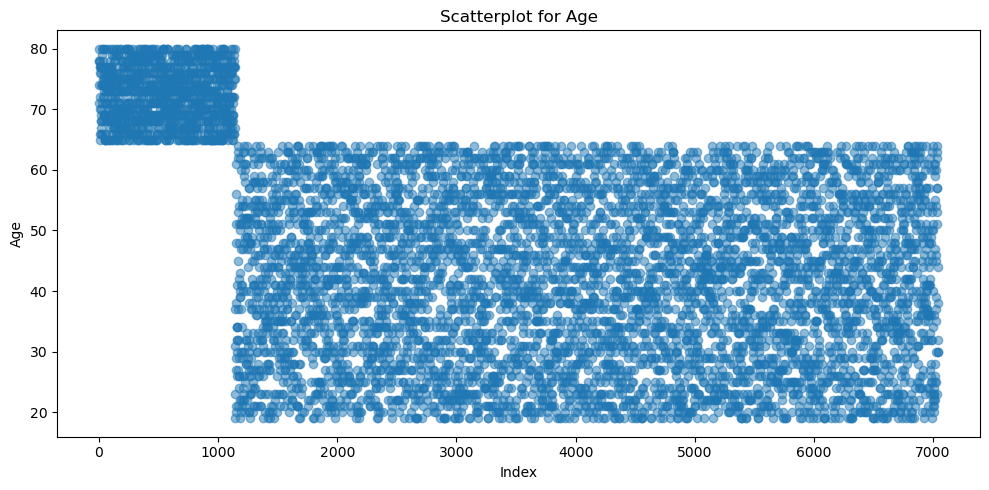

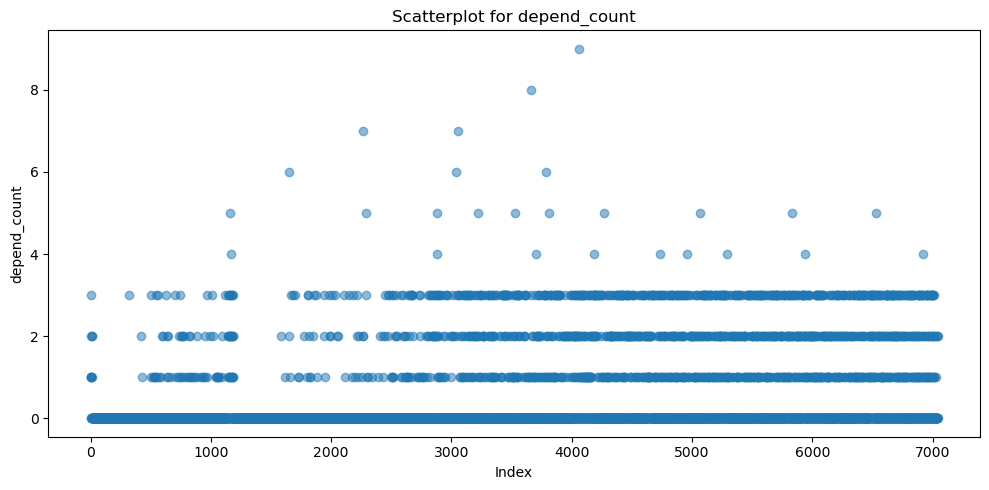

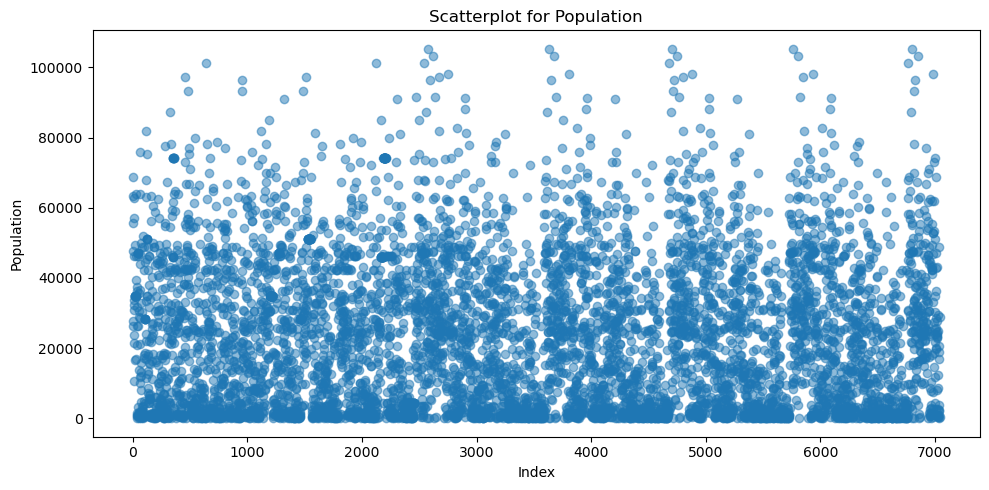

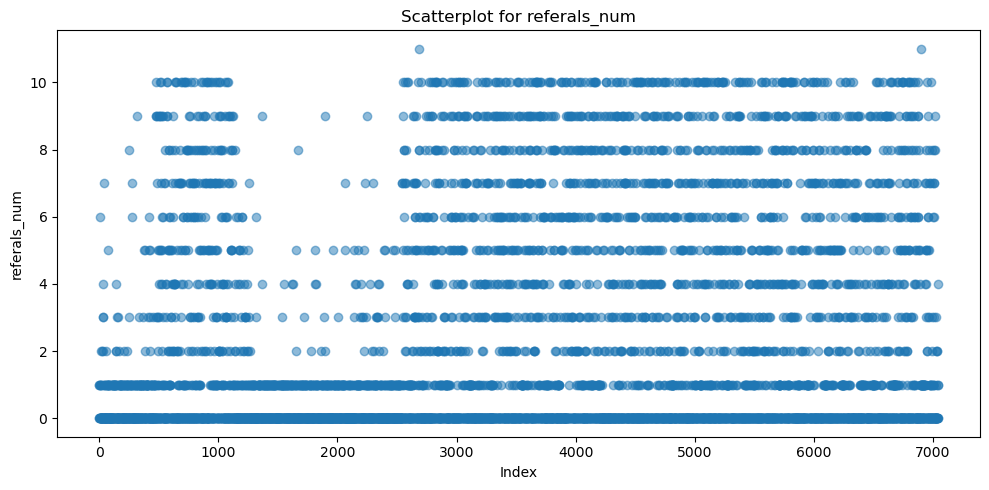

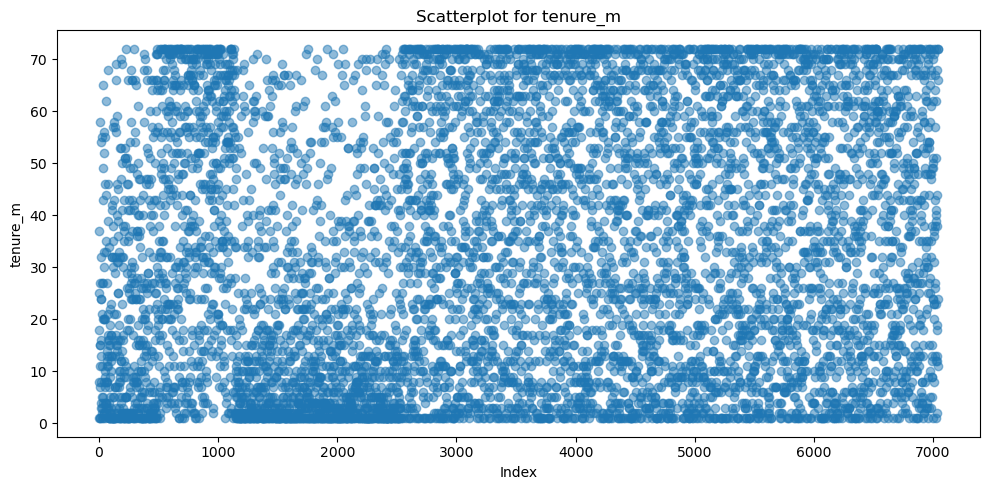

...

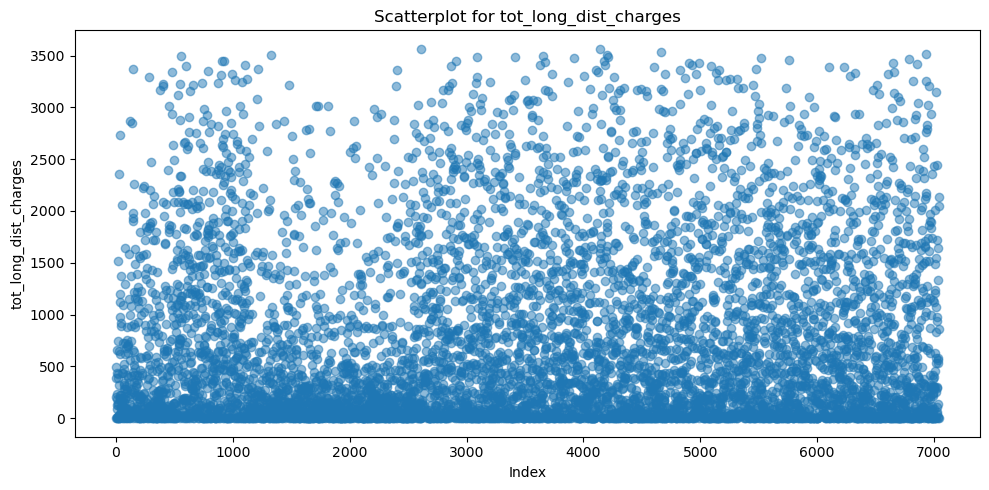

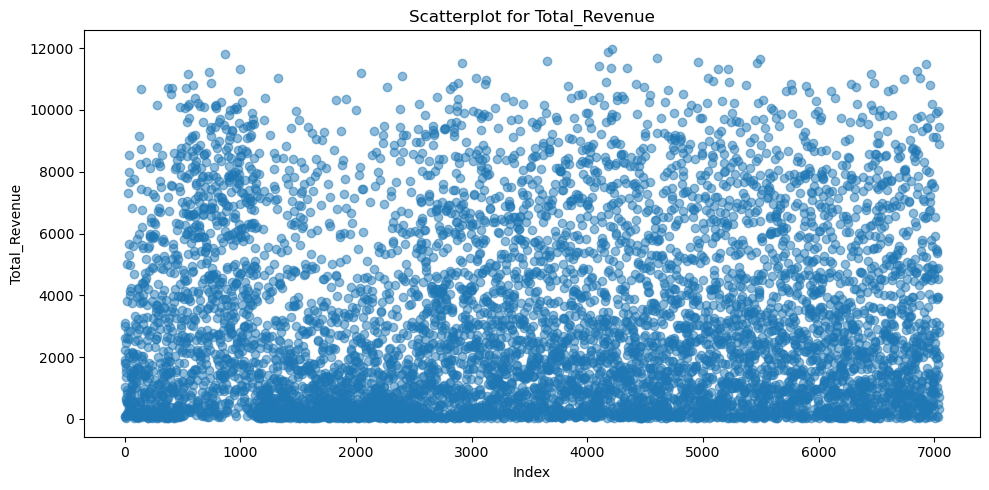

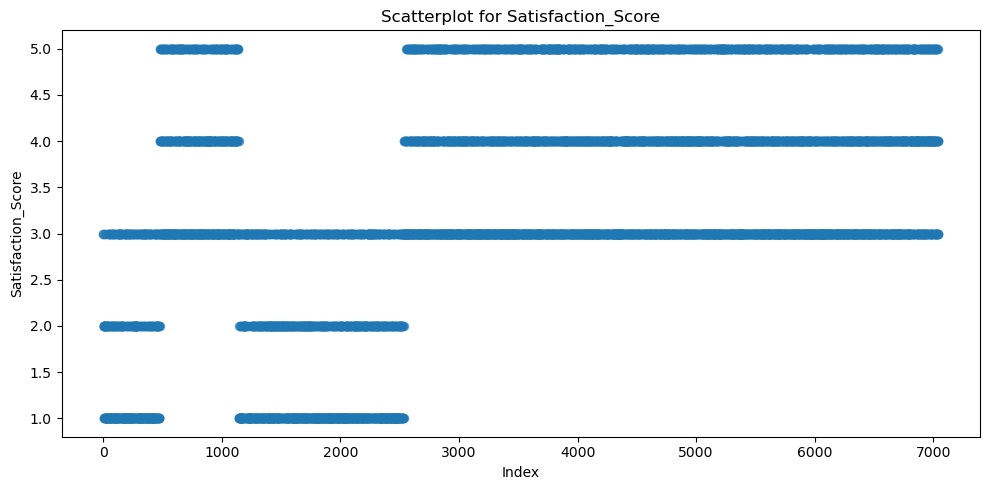

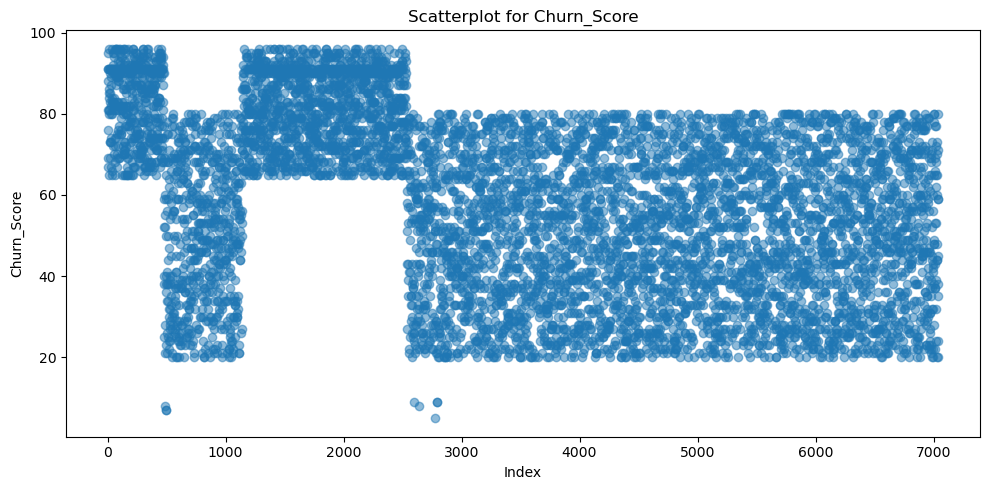

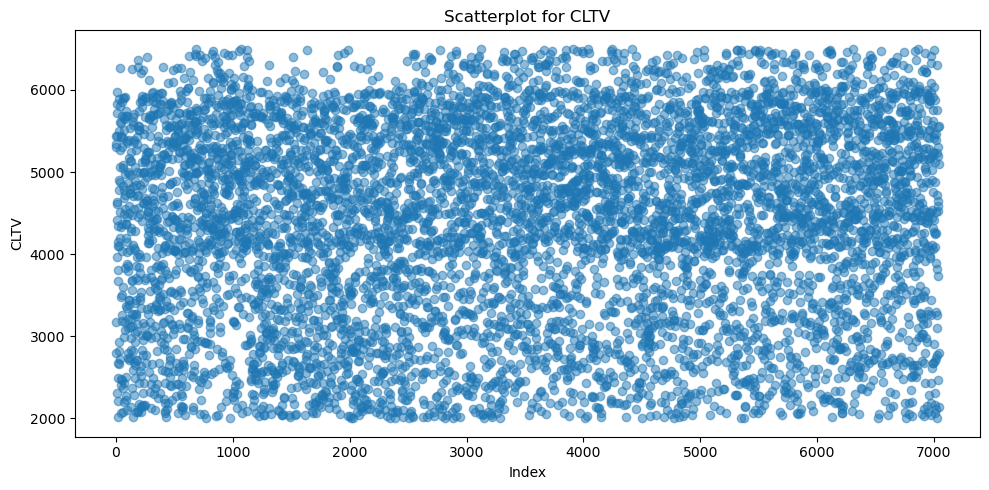

In [47]:
for col in numeric_col:
    plt.figure(figsize = (10,5))
    plt.scatter(df.index, df[col], alpha = 0.5)
    plt.title(f'Scatterplot for {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

## Outlier Treatment

### 1. Population

#### Visualization before outlier treatment

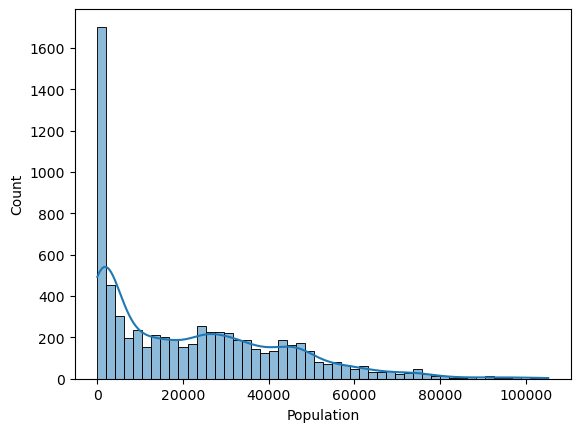

In [48]:
sns.histplot(df['Population'], bins = 50, kde = True)
plt.show()

#### As the population is right skewed and it has a long tail it would be more better if we use Log Transform for outlier treatment, it compresses the big values smoothly without losing the data

In [49]:
df['Population_log'] = np.log1p(df['Population'])

#### Visualization after outlier treatment

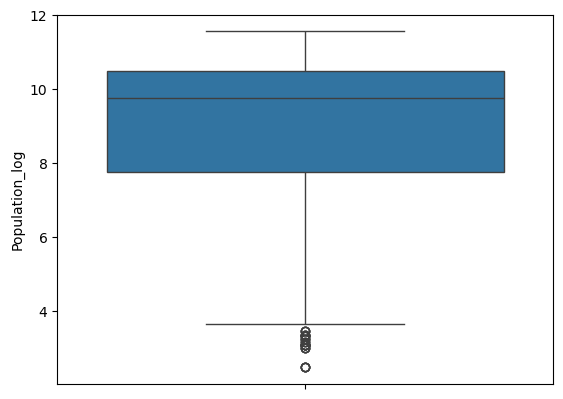

In [50]:
sns.boxplot(y = df['Population_log'])
plt.show()

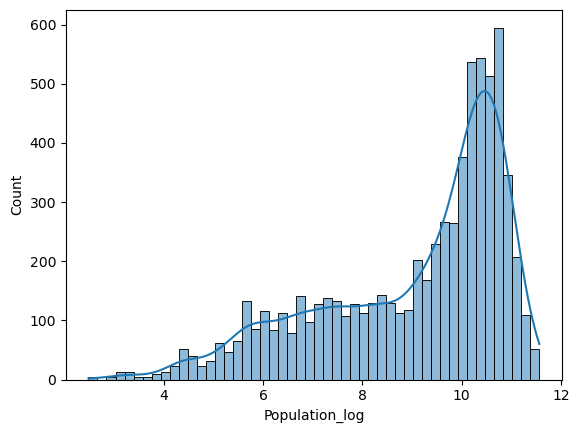

In [51]:
sns.histplot(df['Population_log'], bins = 50, kde = True)
plt.show()

In [52]:
print(df['Population_log'].skew())

-0.9607380381927134


##### -0.977 falls between -1 to -0.5 means moderately negatively skewed much improved after outlier treatment
##### for tree models they are robust to skewness so it is fine but for linear models like logistic regression still have to transform like squaring values to reduce skew further

#

### Applying IQR rule on df['Population'] log transformed data 


In [53]:
Q1 = df['Population_log'].quantile(0.25)
Q3 = df['Population_log'].quantile(0.75)

IQR = Q3 - Q1

ul = Q3 + 1.5 * IQR
ll = Q1 - 1.5 * IQR

print(f'upper_limit: {ul} | lower_limit: {ll} | IQR')

upper_limit: 14.596859245410688 | lower_limit: 3.6579495421621955 | IQR


In [54]:
# Count of Outliers
ul_outliers = df[df['Population_log']>ul].shape[0]
ll_outliers = df[df['Population_log']<ll].shape[0]

total_outliers = ul_outliers + ll_outliers

per_outliers = total_outliers * 100/df['Population_log'].shape[0]

print(f'ul_oultliers: {ul_outliers} | ll_outliers: {ll_outliers} | total_outliers: {total_outliers} | per_outliers: {per_outliers}')

ul_oultliers: 0 | ll_outliers: 37 | total_outliers: 37 | per_outliers: 0.5253443135027687


In [55]:
outlier_mask = (df['Population_log']>ul) | (df['Population_log']<ll)
outlier_rows = df[outlier_mask]

print(outlier_rows[['Population', 'Population_log']])

      Population  Population_log
75            21        3.091042
330           11        2.484907
918           25        3.258097
924           19        2.995732
1225          23        3.178054
1442          19        2.995732
1573          23        3.178054
1754          31        3.465736
1765          19        2.995732
1806          21        3.091042
2018          21        3.091042
2131          21        3.091042
2570          21        3.091042
2587          11        2.484907
3275          27        3.332205
3454          25        3.258097
3455          31        3.465736
3514          28        3.367296
3628          21        3.091042
3644          11        2.484907
4338          27        3.332205
4342          21        3.091042
4523          25        3.258097
4583          28        3.367296
4718          11        2.484907
4953          23        3.178054
5412          27        3.332205
5593          31        3.465736
5651          28        3.367296
6447      

In [56]:
df['Population_log'] = df['Population_log'].clip(lower = ll, upper = ul)

In [57]:
df.drop(['Population'], axis =1, inplace = True)

In [58]:
df.head(2)

,Age,Under_30,sr_citizen,Married,depend_count,City,referals_num,tenure_m,Offer,multi_line,internet_ser,internet_type,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Contract,Paperless_Billing,Payment_Method,Monthly_Charge,Total_Charges,Total_Refunds,tot_long_dist_charges,Total_Revenue,Satisfaction_Score,Customer_Status,Churn_Label,Churn_Score,CLTV,Population_log
0,78,No,Yes,No,0,Los Angeles,0,1,Missing,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.0,0.0,59.65,3,Churned,Yes,91,5433,11.137534
1,74,No,Yes,Yes,1,Los Angeles,1,8,Offer E,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.0,390.8,1024.10,3,Churned,Yes,69,5302,10.927179


####  INSIGHT

##### 1. IQR on Log-Transformed Data:
##### Calculate upper and lower limits (fences) on the log scale to handle strong right skew.
##### The log transform reduces the impact of very large values by pulling them closer to the normal range.

##### 2. Winsorization (Capping):
##### About 37 extreme low values (~0.53%) are capped at the lower limit.
##### This keeps all rows while reducing the effect of these outliers on the model.


#

### 2. Outlier treatment for total_refunds column 

In [59]:
pd.crosstab(df['Total_Refunds'],df['Churn_Label'])

Churn_Label,No,Yes
Total_Refunds,,
0.00,4756,1762
1.01,1,0
1.09,1,0
1.27,0,1
1.31,2,0
1.48,0,1
1.65,1,0
1.66,1,0
1.69,1,0


##### Out of 7043 rows in Total_Refund column 6518 rows fall under 0.0 and also highly correlated with churn_label target column so treating outliers using IQR, Z-score is not recommended because
##### these methods are only used for rare values and therefore binning is best option as it retains the info without removing or capping values, handles skew and sparsity

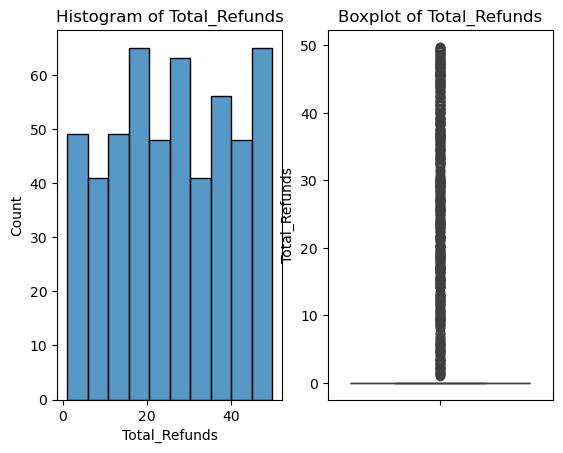

In [60]:
# Before Outlier Treatment
fig, axes = plt.subplots(1,2)
sns.histplot(df[df['Total_Refunds'] > 0.0], x = 'Total_Refunds', bins = 10, ax = axes[0])
axes[0].set_title('Histogram of Total_Refunds')

sns.boxplot(data = df['Total_Refunds'], ax = axes[1])
axes[1].set_title('Boxplot of Total_Refunds')
plt.show()

In [61]:
df['Total_Refund_Flag'] = df['Total_Refunds'].apply(lambda x: 1 if x> 0 else 0)

#Binning the Non Zero Values
non_zero_refunds = df[df['Total_Refunds']>0]['Total_Refunds']

# Bins Based on the quantiles
q_25 = non_zero_refunds.quantile(0.25)
q_50 = non_zero_refunds.quantile(0.50)
q_75 = non_zero_refunds.quantile(0.75)
q_max = non_zero_refunds.max()

df['Total_Refund_Bin'] = pd.cut(df['Total_Refunds'], bins = [0.0, q_25, q_50, q_75, q_max], labels = ['Low', 'Medium', 'High', 'Very_High'])                               

In [62]:
df['Total_Refund_Bin'] = df['Total_Refund_Bin'].astype('object')
df['Total_Refund_Bin'] = df['Total_Refund_Bin'].fillna('Zero')

In [63]:
df['Total_Refund_Bin'].value_counts()

Total_Refund_Bin
Zero         6518
Low           132
Very_High     131
High          131
Medium        131
Name: count, dtype: int64

In [64]:
df.drop(['Total_Refunds'], axis = 1, inplace = True)
df.head(3)

,Age,Under_30,sr_citizen,Married,depend_count,City,referals_num,tenure_m,Offer,multi_line,internet_ser,internet_type,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Contract,Paperless_Billing,Payment_Method,Monthly_Charge,Total_Charges,tot_long_dist_charges,Total_Revenue,Satisfaction_Score,Customer_Status,Churn_Label,Churn_Score,CLTV,Population_log,Total_Refund_Flag,Total_Refund_Bin
0,78,No,Yes,No,0,Los Angeles,0,1,Missing,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,59.65,3,Churned,Yes,91,5433,11.137534,0,Zero
1,74,No,Yes,Yes,1,Los Angeles,1,8,Offer E,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,390.80,1024.10,3,Churned,Yes,69,5302,10.927179,0,Zero
2,71,No,Yes,No,3,Los Angeles,0,18,Offer D,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,203.94,1910.88,2,Churned,Yes,81,3179,10.769222,1,Very_High


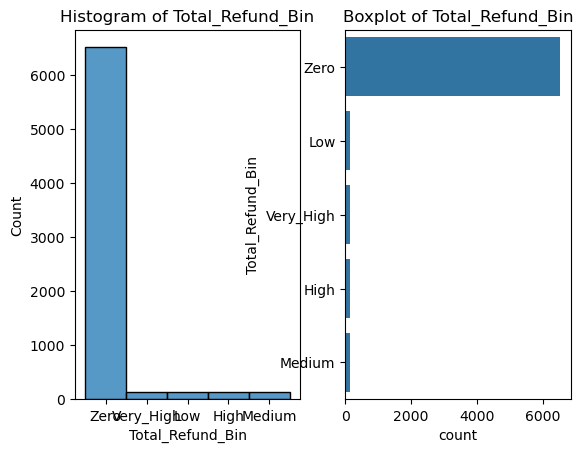

<Figure size 600x400 with 0 Axes>

In [65]:
# after outlier Treatment
fig, axes = plt.subplots(1,2)
plt.figure(figsize = (6,4))
sns.histplot(df['Total_Refund_Bin'], bins = 5, ax = axes[0])
axes[0].set_title('Histogram of Total_Refund_Bin')

sns.countplot(data = df, y = 'Total_Refund_Bin', order = df['Total_Refund_Bin'].value_counts().index, ax=axes[1])
axes[1].set_title('Boxplot of Total_Refund_Bin')
plt.show()

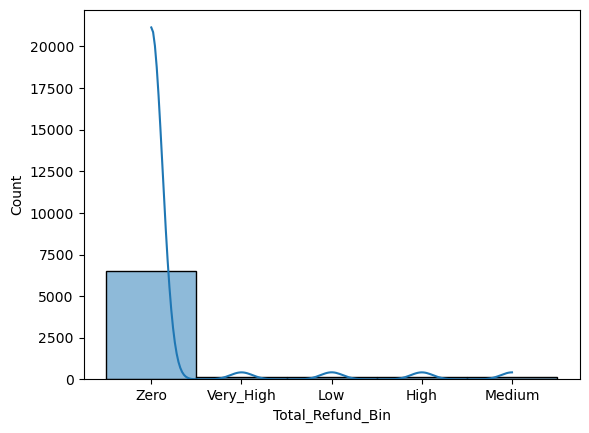

In [66]:
sns.histplot(x = df['Total_Refund_Bin'], bins = 50, kde = True)
plt.show()

#

### 3. Outlier Treatment for depend_count

In [67]:
df['depend_count'].value_counts()

depend_count
0    5416
1     553
2     531
3     517
5      10
4       9
6       3
7       2
8       1
9       1
Name: count, dtype: int64

visualization before outlier treatment

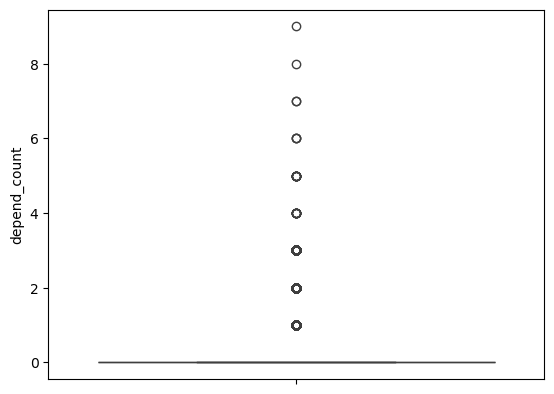

In [68]:
sns.boxplot(data = df, y = 'depend_count')
plt.show()

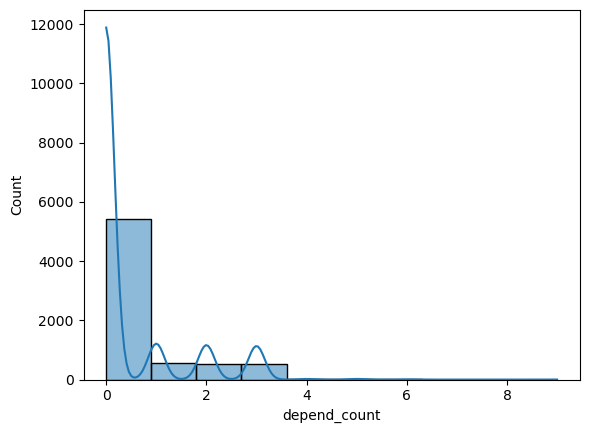

In [69]:
sns.histplot(x = df['depend_count'], bins = 10, kde = True)
plt.show()

### Treating outliers using Binning method for 'dependent_count' column:
The column is a discrete count where over 99% of data is in the 0, 1, 2, or 3 groups.
We applied binning to treat high-end outliers (counts 4 through 9) by lumping them into a single 'Four_or_More' category, which converts the feature into a clean, stable ordinal column for efficient modeling.

In [70]:
bins = [-0.5, 0.5, 1.5, 2.5, 3.5, 9.5]
labels = ['zero', 'one', 'two', 'three', 'four_or_more']

df['depend_count_bin'] = pd.cut(df['depend_count'], bins = bins, labels = labels, include_lowest = True) 

In [71]:
df.drop(['depend_count'], axis =1, inplace = True)
df.head(3)

,Age,Under_30,sr_citizen,Married,City,referals_num,tenure_m,Offer,multi_line,internet_ser,internet_type,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Contract,Paperless_Billing,Payment_Method,Monthly_Charge,Total_Charges,tot_long_dist_charges,Total_Revenue,Satisfaction_Score,Customer_Status,Churn_Label,Churn_Score,CLTV,Population_log,Total_Refund_Flag,Total_Refund_Bin,depend_count_bin
0,78,No,Yes,No,Los Angeles,0,1,Missing,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,59.65,3,Churned,Yes,91,5433,11.137534,0,Zero,zero
1,74,No,Yes,Yes,Los Angeles,1,8,Offer E,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,390.80,1024.10,3,Churned,Yes,69,5302,10.927179,0,Zero,one
2,71,No,Yes,No,Los Angeles,0,18,Offer D,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,203.94,1910.88,2,Churned,Yes,81,3179,10.769222,1,Very_High,three


#### 4. Outlier Treatment for tot_lon_dist_char

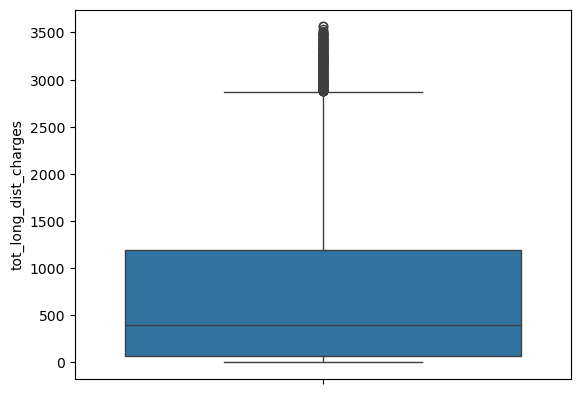

In [72]:
sns.boxplot(y = df['tot_long_dist_charges'])
plt.show()

##### Using Percentile method treating outliers for 'tot_long_dist_charges' column

In [73]:
lower_cap = df['tot_long_dist_charges'].quantile(0.01)
upper_cap = df['tot_long_dist_charges'].quantile(0.99)

df['tot_long_dist_charges'] = df['tot_long_dist_charges'].clip(lower = lower_cap, upper = upper_cap)

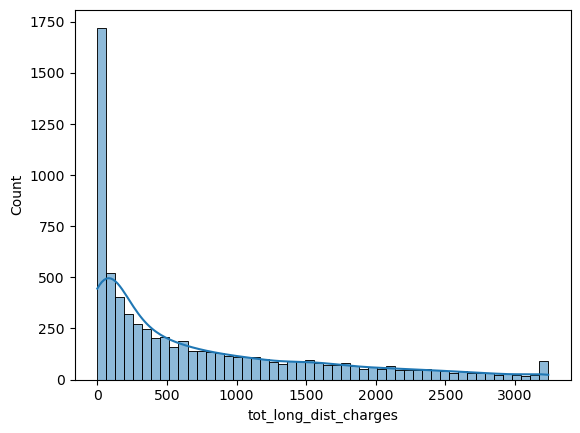

In [74]:
sns.histplot(x = df['tot_long_dist_charges'], bins = 50, kde = True)
plt.show()

#

#### 5. Outlier treatment for Avg_mnthly_GB_download

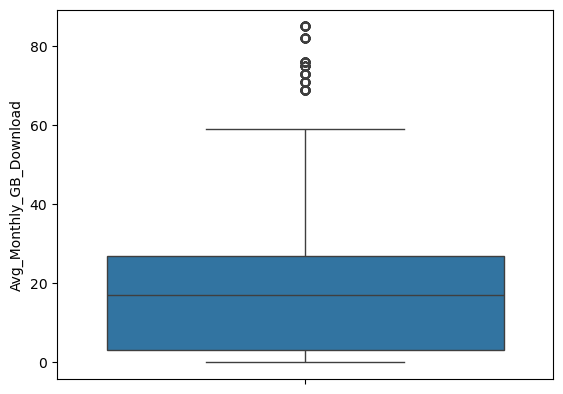

In [75]:
sns.boxplot(y = df['Avg_Monthly_GB_Download'])
plt.show()

##### Using IQR capping method for Avg_Monthly_GB_Download' column outlier treatment

In [76]:
Q1 = df['Avg_Monthly_GB_Download'].quantile(0.25)
Q3 = df['Avg_Monthly_GB_Download'].quantile(0.75)

IQR = Q3 - Q1

ll = Q1 - 1.5 * IQR
ul = Q1 + 1.5 * IQR

print(f'lower_limit: {ll} | upper_limit: {ul}')

lower_limit: -33.0 | upper_limit: 39.0


In [77]:
ul_outliers = df[df['Avg_Monthly_GB_Download']>ul].shape[0]
ll_outliers = df[df['Avg_Monthly_GB_Download']<ll].shape[1]

total_outliers = ul_outliers + ll_outliers

per_outliers = total_outliers*100/df['Avg_Monthly_GB_Download'].shape[0]

print(f'ul_outliers: {ul_outliers} | ll_outliers: {ll_outliers} | total_outliers: {total_outliers} | per_outliers: {per_outliers}')

ul_outliers: 1201 | ll_outliers: 36 | total_outliers: 1237 | per_outliers: 17.563538264943915


In [78]:
df['Avg_Monthly_GB_Download'] = df['Avg_Monthly_GB_Download'].clip(lower = ll, upper = ul)

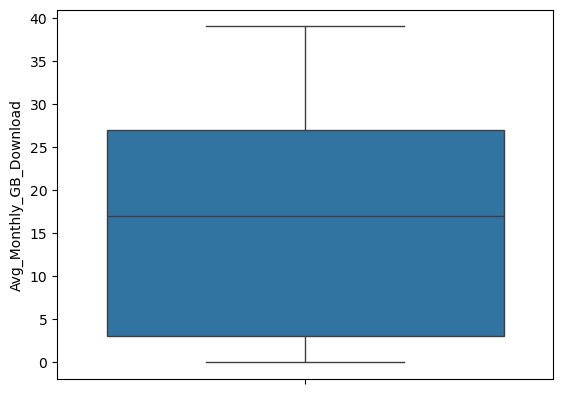

In [79]:
# Visualization after outlier treatment

sns.boxplot(y = df['Avg_Monthly_GB_Download'])
plt.show()

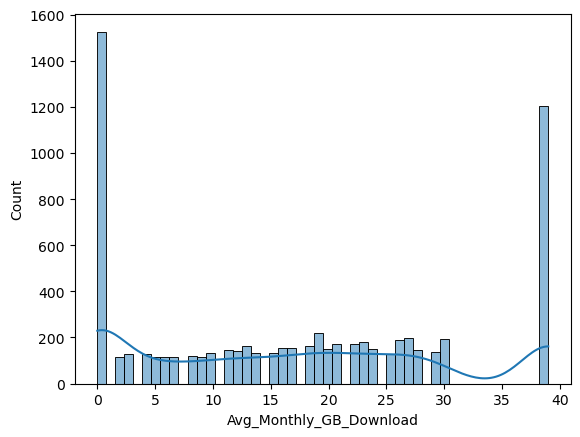

In [80]:
sns.histplot(x = df['Avg_Monthly_GB_Download'], bins = 50, kde = True)
plt.show()

#

#### 6. Outlier Treatment for 'Total_Revenue' Column

#### Visualization before Outlier Treatment

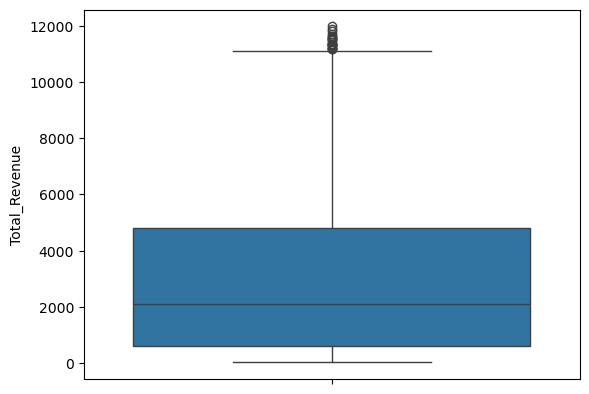

In [81]:
sns.boxplot(data = df['Total_Revenue'])
plt.show()

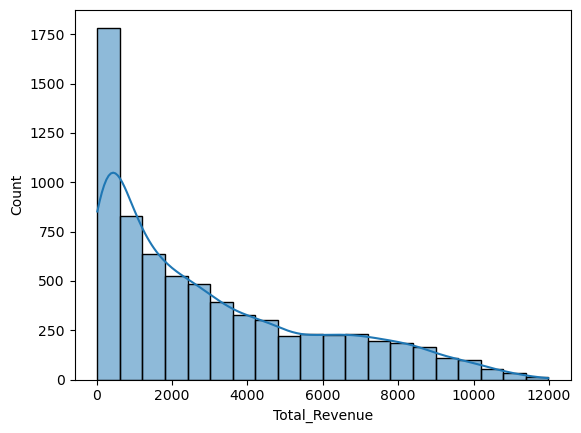

In [82]:
sns.histplot(x = df['Total_Revenue'], bins = 20, kde = True)
plt.show()

#### as this column is not normally distributed and Right skewed so log_transformation and later by applying IQR capping method can handle this skewness without losing data

In [83]:
df['Total_Revenue_log'] = np.log1p(df['Total_Revenue'])

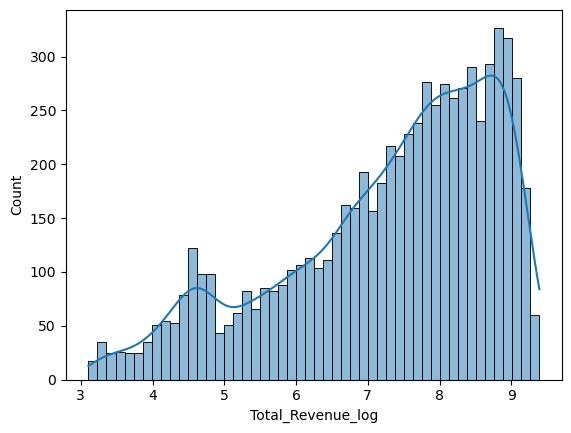

In [84]:
sns.histplot(x = df['Total_Revenue_log'], bins = 50, kde = True)
plt.show()

In [85]:
print(df['Total_Revenue_log'].skew())

-0.8038790651678


#### applying IQR capping method 

In [86]:
Q1 = df['Total_Revenue_log'].quantile(0.25)
Q3 = df['Total_Revenue_log'].quantile(0.75)

IQR = Q3 - Q1

ul = Q3 + 1.5 * IQR
ll = Q1 - 1.5 * IQR

print(f'upper_limit: {ul} | lower_limit: {ll} | IQR: {IQR}')

upper_limit: 11.580215816068531 | lower_limit: 3.3044881964620214 | IQR: 2.0689319049016275


In [87]:
ul_outliers = df[df['Total_Revenue_log']>ul].shape[0]
ll_outliers = df[df['Total_Revenue_log']<ll].shape[0]

total_outliers = ul_outliers + ll_outliers
perc_outliers = total_outliers * 100 / df['Total_Revenue_log'].shape[0]

print(f'ul_outliers: {ul_outliers}| ll_outliers: {ll_outliers} | total: {total_outliers}| total%: {perc_outliers}')

ul_outliers: 0| ll_outliers: 45 | total: 45| total%: 0.638932273179043


In [88]:
df['Total_Revenue_log'] = df['Total_Revenue_log'].clip(lower = ll, upper = ul)

In [89]:
df.drop(['Total_Revenue'], axis = 1, inplace = True)

#### Visualization after Outlier treatment

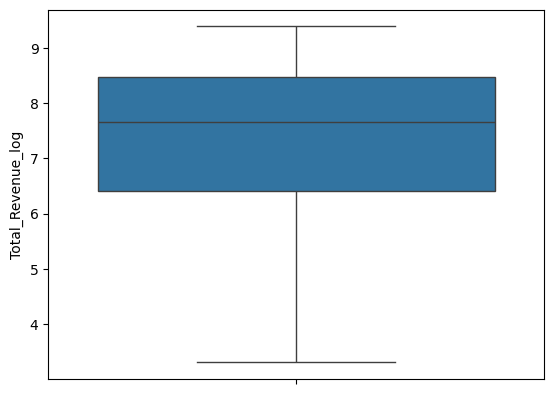

In [90]:
sns.boxplot(y = df['Total_Revenue_log'])
plt.show()

#

#### 7. Outlier Treatment for 'referals_num' Column

In [91]:
df['referals_num'].value_counts()

referals_num
0     3821
1     1086
5      264
3      255
7      248
9      238
4      236
2      236
10     223
6      221
8      213
11       2
Name: count, dtype: int64

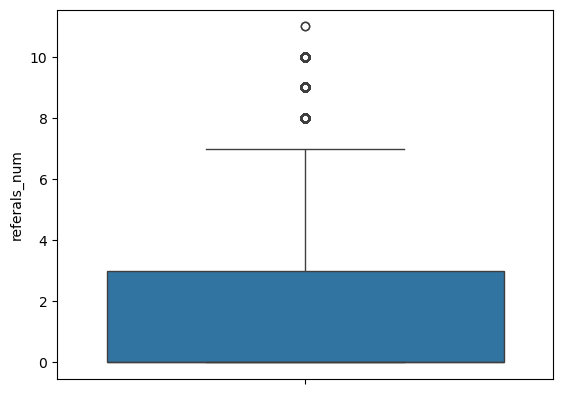

In [92]:
sns.boxplot(data = df['referals_num'])
plt.show()

### Fixing referral count outliers.
Since most customers have 0-4 referrals and very few have more, we grouped all high counts (5+) into one 'Five_or_More' bucket. This stops those rare numbers from skewing the model.

In [93]:
bins = [-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 999] 
labels = ['None', 'One', 'Two', 'Three', 'Four', 'Five_or_More']

df['Referrals_Bin'] = pd.cut(df['referals_num'], bins=bins, labels=labels, right=True,include_lowest=True)

# drop the original referals_num column
df.drop(['referals_num'], axis = 1, inplace = True)

In [94]:
df.columns

Index(['Age', 'Under_30', 'sr_citizen', 'Married', 'City', 'tenure_m', 'Offer',
       'multi_line', 'internet_ser', 'internet_type',
       'Avg_Monthly_GB_Download', 'online_security', 'Online_Backup',
       'device_pro_plan', 'prem_tech_supp', 'Streaming_TV', 'Streaming_Movies',
       'Streaming_Music', 'Unlimited_Data', 'Contract', 'Paperless_Billing',
       'Payment_Method', 'Monthly_Charge', 'Total_Charges',
       'tot_long_dist_charges', 'Satisfaction_Score', 'Customer_Status',
       'Churn_Label', 'Churn_Score', 'CLTV', 'Population_log',
       'Total_Refund_Flag', 'Total_Refund_Bin', 'depend_count_bin',
       'Total_Revenue_log', 'Referrals_Bin'],
      dtype='object')

#

## Dropping Redundant column

###  DROP COLUMN: 'Customer_Status', 'Churn_Score'
Both columns are direct, functional duplicate (perfect redundancy) of the target variable, 'Churn_Label'. Dropping it prevents severe data leakage and perfect multicollinearity in the final model, ensuring legitimate prediction scores.

In [95]:
df.drop(['Customer_Status', 'Churn_Score'], axis = 1, inplace = True)

#

### Updating num_col and cat_col

In [114]:
num_col2 = df.select_dtypes(include = ['int64', 'float']).copy()
cat_col2 = df.select_dtypes(include = ['object', 'category']).copy()

In [115]:
print(num_col2.columns)

Index(['Age', 'Under_30', 'sr_citizen', 'Married', 'tenure_m', 'multi_line',
       'internet_ser', 'Avg_Monthly_GB_Download', 'online_security',
       'Online_Backup', 'device_pro_plan', 'prem_tech_supp', 'Streaming_TV',
       'Streaming_Movies', 'Streaming_Music', 'Unlimited_Data',
       'Paperless_Billing', 'Monthly_Charge', 'Total_Charges',
       'tot_long_dist_charges', 'Satisfaction_Score', 'Churn_Label', 'CLTV',
       'Population_log', 'Total_Refund_Flag', 'Total_Refund_Bin',
       'depend_count_bin', 'Total_Revenue_log', 'Referrals_Bin',
       'City_Clean_Other_City', 'City_Clean_Sacramento',
       'City_Clean_San Diego', 'City_Clean_San Francisco',
       'City_Clean_San Jose', 'Offer_Offer A', 'Offer_Offer B',
       'Offer_Offer C', 'Offer_Offer D', 'Offer_Offer E', 'internet_type_DSL',
       'internet_type_Fiber Optic', 'internet_type_Unknown',
       'Contract_One Year', 'Contract_Two Year', 'Payment_Method_Credit Card',
       'Payment_Method_Mailed Check'],
    

In [98]:
print(cat_col2.columns)

Index(['Under_30', 'sr_citizen', 'Married', 'City', 'Offer', 'multi_line',
       'internet_ser', 'internet_type', 'online_security', 'Online_Backup',
       'device_pro_plan', 'prem_tech_supp', 'Streaming_TV', 'Streaming_Movies',
       'Streaming_Music', 'Unlimited_Data', 'Contract', 'Paperless_Billing',
       'Payment_Method', 'Churn_Label', 'Total_Refund_Bin', 'depend_count_bin',
       'Referrals_Bin'],
      dtype='object')


#

## Encoding the Categorical Features

### --- FINAL CATEGORICAL ENCODING STRATEGY ---

#### 1. Label Encoding (Ordinal Data):
Used for features where order matters (e.g., 'Total_Refund_Flag', 'referrals_bin').
This converts the categories into ordered integers (1 < 2 < 3), which the tree models use efficiently.

#### 2. One-Hot Encoding (Nominal Data):
Used for features where order does NOT matter (e.g., 'Contract', 'City_Clean', 'Payment_Method').
This creates independent binary features (0s and 1s) to prevent the model from assuming false numerical relationships.

Binary flag columns (0/1) are retained as numerical features without further encoding.

#


#### ----- CARDINALITY REDUCTION: City Column -----
The 'City' column has very high cardinality (too many unique cities), which would lead to the 'Curse of Dimensionality' and model overfitting if One-Hot Encoded directly.

#### Strategy: 
identify all cities appearing less than 1% of the time (rare categories) and lump them into a single 'Other_City' feature. This maintains predictive power from major cities while eliminating noise and simplifying the model.
THRESHOLD = 0.01

In [99]:
THRESHOLD = 0.01 # The threshold determines which cities are considered "rare"

city_counts = df['City'].value_counts(normalize=True)  # Calculate the frequency of each unique city name
rare_cities = city_counts[city_counts < THRESHOLD].index  # Identify all cities whose frequency is below the defined threshold

df['City_Clean'] = df['City'].replace(rare_cities, 'Other_City') # Replace all instances of the rare city names with the standardized category 'Other_City'

print(f"Original number of unique cities: {df['City'].nunique()}")    # Verify the new, reduced cardinality
print(f"New number of unique city categories: {df['City_Clean'].nunique()}")

# This code successfully replaces all low-frequency cities with the 'Other\_City' category, making the column ready for safe One-Hot Encoding later.

Original number of unique cities: 1106
New number of unique city categories: 6


In [100]:
# 5. Drop the original, noisy column
df = df.drop(columns=['City'])

#

In [101]:
df.columns

Index(['Age', 'Under_30', 'sr_citizen', 'Married', 'tenure_m', 'Offer',
       'multi_line', 'internet_ser', 'internet_type',
       'Avg_Monthly_GB_Download', 'online_security', 'Online_Backup',
       'device_pro_plan', 'prem_tech_supp', 'Streaming_TV', 'Streaming_Movies',
       'Streaming_Music', 'Unlimited_Data', 'Contract', 'Paperless_Billing',
       'Payment_Method', 'Monthly_Charge', 'Total_Charges',
       'tot_long_dist_charges', 'Satisfaction_Score', 'Churn_Label',
       'Churn_Score', 'CLTV', 'Population_log', 'Total_Refund_Flag',
       'Total_Refund_Bin', 'depend_count_bin', 'Total_Revenue_log',
       'Referrals_Bin', 'City_Clean'],
      dtype='object')

In [102]:
for col in df.columns:
    print(col, df[col].unique())
    print('-'*50)

Age [78 74 71 80 72 76 66 70 77 65 67 68 69 79 75 73 37 19 31 23 38 21 29 61
 27 20 56 51 48 32 34 41 30 26 62 64 45 53 63 42 24 54 39 43 50 22 40 47
 60 52 55 59 49 58 25 28 33 44 57 46 36 35]
--------------------------------------------------
Under_30 ['No' 'Yes']
--------------------------------------------------
sr_citizen ['Yes' 'No']
--------------------------------------------------
Married ['No' 'Yes']
--------------------------------------------------
tenure_m [ 1  8 18 25 37 27 58 15  7 11  3 13 16 24  4 32 54  2 21 55  5 20 65 49
 43 56 52 33 30 46  9 10 35 44 62 14 12 17 39 68 34 22 19 23 42 41 57 38
 29 66 69 40 31 59 36 45 53 70 47 50 51 72 26  6 28 48 61 71 60 64 67 63]
--------------------------------------------------
Offer ['Missing' 'Offer E' 'Offer D' 'Offer C' 'Offer B' 'Offer A']
--------------------------------------------------
multi_line ['No' 'Yes']
--------------------------------------------------
internet_ser ['Yes' 'No']
-----------------------------------

In [116]:
ordinal_cols = ['depend_count_bin','Under_30', 'sr_citizen', 'Married', 'multi_line', 'internet_ser', 'online_security', 'Online_Backup','device_pro_plan', 'prem_tech_supp', 'Streaming_TV', 
                'Streaming_Movies', 'Streaming_Music', 'Unlimited_Data', 'Paperless_Billing','Churn_Label', 'Total_Refund_Flag', 'Total_Refund_Bin', 'Referrals_Bin']

nominal_cols = ['City_Clean', 'Offer', 'internet_type', 'Contract', 'Payment_Method']

### ------ Label Encoding for Ordinal Features -------

In [104]:
 from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in ordinal_cols:
    df[col] = df[col].astype(str)
    df[col] = le.fit_transform(df[col])

### ------ One-Hot Encoding for Nominal Features ------

In [105]:
df = pd.get_dummies(df, columns = nominal_cols, prefix = nominal_cols, drop_first = True)
df.drop(columns = nominal_cols, errors='ignore', inplace=True)

bool_cols = df.select_dtypes(include='bool').columns
df[bool_cols] = df[bool_cols].astype(int)

print("One-Hot Encoding complete. New dummy variables created.")
print(f"Total number of features in DataFrame: {df.shape[1]}")

One-Hot Encoding complete. New dummy variables created.
Total number of features in DataFrame: 47


In [106]:
df.head()

,Age,Under_30,sr_citizen,Married,tenure_m,multi_line,internet_ser,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Paperless_Billing,Monthly_Charge,Total_Charges,tot_long_dist_charges,Satisfaction_Score,Churn_Label,Churn_Score,CLTV,Population_log,Total_Refund_Flag,Total_Refund_Bin,depend_count_bin,Total_Revenue_log,Referrals_Bin,City_Clean_Other_City,City_Clean_Sacramento,City_Clean_San Diego,City_Clean_San Francisco,City_Clean_San Jose,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E,internet_type_DSL,internet_type_Fiber Optic,internet_type_Unknown,Contract_One Year,Contract_Two Year,Payment_Method_Credit Card,Payment_Method_Mailed Check
0,78,0,1,0,1,0,1,8,0,0,1,0,0,1,0,0,1,39.65,39.65,0.00,3,1,91,5433,11.137534,0,4,4,4.105120,2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,74,0,1,1,8,1,1,17,0,1,0,0,0,0,0,1,1,80.65,633.30,390.80,3,1,69,5302,10.927179,0,4,1,6.932545,3,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
2,71,0,1,0,18,1,1,39,0,0,0,0,1,1,1,1,1,95.45,1752.55,203.94,2,1,81,3179,10.769222,1,3,2,7.555842,2,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0
3,78,0,1,1,25,0,1,12,0,1,1,0,1,1,0,1,1,98.50,2514.50,494.00,2,1,88,5337,10.232036,1,1,1,8.005057,3,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0
4,80,0,1,1,37,1,1,14,0,0,0,0,0,0,0,1,1,76.50,2868.15,234.21,2,1,67,2793,10.176031,0,4,1,8.040241,3,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0


#

# 📌 Multicollinearity check

### Calculating VIF to check Multi Collinearity between features

In [110]:
df.columns

Index(['Age', 'Under_30', 'sr_citizen', 'Married', 'tenure_m', 'multi_line',
       'internet_ser', 'Avg_Monthly_GB_Download', 'online_security',
       'Online_Backup', 'device_pro_plan', 'prem_tech_supp', 'Streaming_TV',
       'Streaming_Movies', 'Streaming_Music', 'Unlimited_Data',
       'Paperless_Billing', 'Monthly_Charge', 'Total_Charges',
       'tot_long_dist_charges', 'Satisfaction_Score', 'Churn_Label',
       'Churn_Score', 'CLTV', 'Population_log', 'Total_Refund_Flag',
       'Total_Refund_Bin', 'depend_count_bin', 'Total_Revenue_log',
       'Referrals_Bin', 'City_Clean_Other_City', 'City_Clean_Sacramento',
       'City_Clean_San Diego', 'City_Clean_San Francisco',
       'City_Clean_San Jose', 'Offer_Offer A', 'Offer_Offer B',
       'Offer_Offer C', 'Offer_Offer D', 'Offer_Offer E', 'internet_type_DSL',
       'internet_type_Fiber Optic', 'internet_type_Unknown',
       'Contract_One Year', 'Contract_Two Year', 'Payment_Method_Credit Card',
       'Payment_Method_Maile

In [117]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

x_vif = df.drop(columns=['Churn_Label']) 

x_vif_const = add_constant(x_vif, has_constant='add')

vif = pd.DataFrame()
vif['Feature'] = x_vif_const.columns
vif['VIF'] = [variance_inflation_factor(x_vif_const.values, i) for i in range(x_vif_const.shape[1])]

print("--- Multicollinearity Check (VIF) on ALL Predictors ---")
print(vif.sort_values(by='VIF', ascending=False))

--- Multicollinearity Check (VIF) on ALL Predictors ---
                        Feature        VIF
7                  internet_ser        inf
41        internet_type_Unknown        inf
18               Monthly_Charge  33.336667
5                      tenure_m  15.786789
19                Total_Charges  11.976222
40    internet_type_Fiber Optic   8.929786
27            Total_Revenue_log   8.574623
14             Streaming_Movies   5.879452
24            Total_Refund_Flag   5.677918
25             Total_Refund_Bin   5.662449
15              Streaming_Music   4.930400
1                           Age   4.094415
29        City_Clean_Other_City   2.908702
8       Avg_Monthly_GB_Download   2.869378
3                    sr_citizen   2.766886
2                      Under_30   2.689338
43            Contract_Two Year   2.422501
13                 Streaming_TV   2.398649
16               Unlimited_Data   2.346999
39            internet_type_DSL   2.322924
20        tot_long_dist_charges   2.29570

#### Heatmap

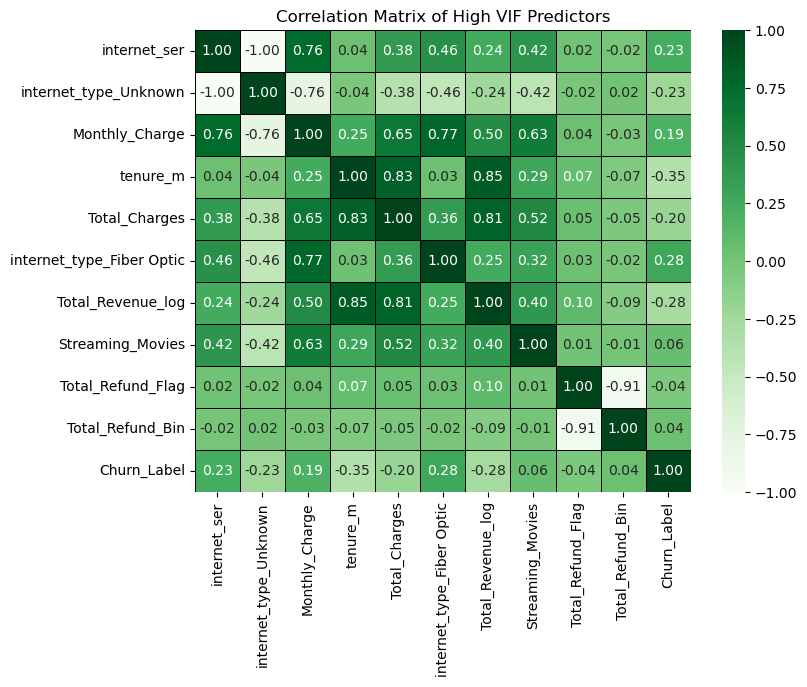

In [112]:
cols = ['internet_ser', 'internet_type_Unknown', 'Monthly_Charge', 'tenure_m', 'Total_Charges', 'internet_type_Fiber Optic', 'Total_Revenue_log', 'Streaming_Movies', 'Total_Refund_Flag',
        'Total_Refund_Bin', 'Churn_Label']

plt.figure(figsize = (8,6))
sns.heatmap(df[cols].corr(), annot = True, cmap = 'Greens', fmt = '.2f', linewidth = 0.5, linecolor = 'black')
plt.title('Correlation Matrix of High VIF Predictors')
plt.show()

#

### --- RESOLVING EXTREME MULTICOLLINEARITY (FINAL DROPS) ---

#### DROPPING COLUMNS: internet_ser, internet_type_Unknown, Total_Charges, Total_Refund_Bin
These features were removed to address severe mathematical instability.
1. internet_ser, internet_type_Unknown: Dropped immediately due to infinite VIF, indicating perfect OHE redundancy.
2. Systemic Redundancy (Monthly_Charge, Total_Charges): Dropped because they were highly redundant with the most powerful feature, 'tenure_m'and the less complex pricing signal was retained.
3. Redundant Signal (Total_Refund_Bin): Dropped to keep the cleaner, binary 'Total_Refund_Flag', which conveys the same information more efficiently.

#

In [118]:
df.drop(['internet_ser', 'internet_type_Unknown', 'Total_Charges', 'Total_Refund_Bin'], axis =1, inplace = True)

In [119]:
# calculating vif again
x_vif = df.drop(columns=['Churn_Label']) 

x_vif_const = add_constant(x_vif, has_constant='add')

vif = pd.DataFrame()
vif['Feature'] = x_vif_const.columns
vif['VIF'] = [variance_inflation_factor(x_vif_const.values, i) for i in range(x_vif_const.shape[1])]

print("--- Multicollinearity Check (VIF) on ALL Predictors ---")
print(vif.sort_values(by='VIF', ascending=False))

--- Multicollinearity Check (VIF) on ALL Predictors ---
                        Feature         VIF
0                         const  235.159246
17               Monthly_Charge   22.332785
5                      tenure_m    8.576091
37    internet_type_Fiber Optic    8.400998
24            Total_Revenue_log    7.990432
13             Streaming_Movies    5.645005
14              Streaming_Music    4.920011
1                           Age    4.087029
26        City_Clean_Other_City    2.907250
3                    sr_citizen    2.755602
2                      Under_30    2.626415
7       Avg_Monthly_GB_Download    2.413857
39            Contract_Two Year    2.353134
12                 Streaming_TV    2.231106
18        tot_long_dist_charges    2.153846
15               Unlimited_Data    1.995054
36            internet_type_DSL    1.961786
28         City_Clean_San Diego    1.933466
6                    multi_line    1.720439
11               prem_tech_supp    1.661382
10              devi

<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

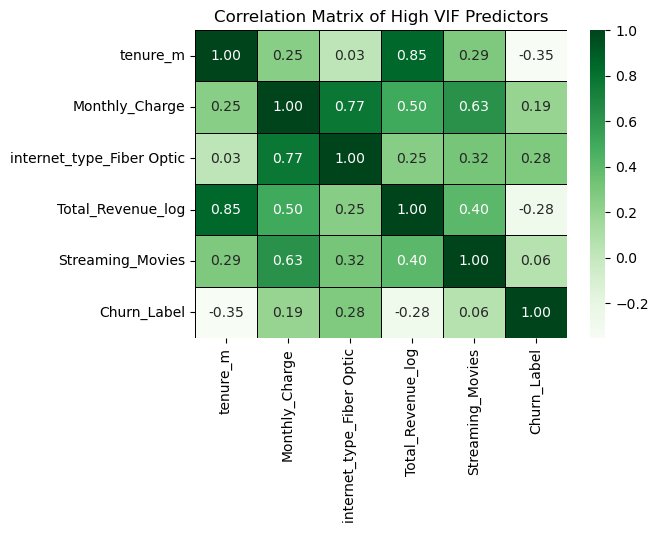

In [125]:
cols = ['tenure_m', 'Monthly_Charge', 'internet_type_Fiber Optic', 'Total_Revenue_log', 'Streaming_Movies', 'Churn_Label']

plt.figure(figsize = (6,4))
sns.heatmap(df[cols].corr(), annot = True, cmap = 'Greens', fmt = '.2f', linewidth = 0.5, linecolor = 'black')
plt.title('Correlation Matrix of High VIF Predictors')
plt.show()

In [126]:
df.drop(['internet_type_Fiber Optic'], axis = 1, inplace = True)

In [127]:
# calculating vif again
x_vif = df.drop(columns=['Churn_Label']) 

x_vif_const = add_constant(x_vif, has_constant='add')

vif = pd.DataFrame()
vif['Feature'] = x_vif_const.columns
vif['VIF'] = [variance_inflation_factor(x_vif_const.values, i) for i in range(x_vif_const.shape[1])]

print("--- Multicollinearity Check (VIF) on ALL Predictors ---")
print(vif.sort_values(by='VIF', ascending=False))

--- Multicollinearity Check (VIF) on ALL Predictors ---
                        Feature         VIF
0                         const  231.489829
5                      tenure_m    8.380595
24            Total_Revenue_log    7.930956
17               Monthly_Charge    7.280735
13             Streaming_Movies    5.341371
14              Streaming_Music    4.919474
1                           Age    4.086718
26        City_Clean_Other_City    2.906984
3                    sr_citizen    2.753784
2                      Under_30    2.621123
7       Avg_Monthly_GB_Download    2.378755
38            Contract_Two Year    2.353126
18        tot_long_dist_charges    2.115952
15               Unlimited_Data    1.970785
28         City_Clean_San Diego    1.933421
12                 Streaming_TV    1.889871
37            Contract_One Year    1.620095
6                    multi_line    1.578857
36            internet_type_DSL    1.552983
10              device_pro_plan    1.548427
11               pre

## Insight
#### FINAL DROP LIST INSIGHT
dropping these features to clean up final redundancy and fix all math errors. 
1. Total_Charges: Removed because it's a redundant running sum.
2. Total_Refund_Bin: Removed because the simpler flag (Total_Refund_Flag) does the same job.
3. internet_ser / internet_type_Unknown: Removed because they had infinite VIF (perfect duplicates) and would crash the model.

#

# 📌 Data Splitting into Train and Test

In [128]:
x = df.drop('Churn_Label', axis = 1)
y = df[['Churn_Label']]

In [129]:
x_train, x_test, y_train, y_test = train_test_split(x,y, train_size = 0.7, random_state = 42)
print(x.shape, x_train.shape, x_test.shape)

(7043, 40) (4930, 40) (2113, 40)


In [130]:
x_train.head(2)

,Age,Under_30,sr_citizen,Married,tenure_m,multi_line,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Paperless_Billing,Monthly_Charge,tot_long_dist_charges,Satisfaction_Score,CLTV,Population_log,Total_Refund_Flag,depend_count_bin,Total_Revenue_log,Referrals_Bin,City_Clean_Other_City,City_Clean_Sacramento,City_Clean_San Diego,City_Clean_San Francisco,City_Clean_San Jose,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E,internet_type_DSL,Contract_One Year,Contract_Two Year,Payment_Method_Credit Card,Payment_Method_Mailed Check
1695,32,0,0,0,3,1,30,0,0,1,0,1,1,1,0,1,100.95,35.82,1,5351,10.611819,0,4,5.931635,2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1095,69,0,1,0,50,1,23,1,1,0,0,1,0,0,0,1,70.35,1261.50,3,5596,9.070618,0,4,8.479927,2,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0


In [131]:
x_test.head(2)

,Age,Under_30,sr_citizen,Married,tenure_m,multi_line,Avg_Monthly_GB_Download,online_security,Online_Backup,device_pro_plan,prem_tech_supp,Streaming_TV,Streaming_Movies,Streaming_Music,Unlimited_Data,Paperless_Billing,Monthly_Charge,tot_long_dist_charges,Satisfaction_Score,CLTV,Population_log,Total_Refund_Flag,depend_count_bin,Total_Revenue_log,Referrals_Bin,City_Clean_Other_City,City_Clean_Sacramento,City_Clean_San Diego,City_Clean_San Francisco,City_Clean_San Jose,Offer_Offer A,Offer_Offer B,Offer_Offer C,Offer_Offer D,Offer_Offer E,internet_type_DSL,Contract_One Year,Contract_Two Year,Payment_Method_Credit Card,Payment_Method_Mailed Check
185,73,0,1,1,47,0,26,0,0,0,0,0,0,0,1,0,70.55,1266.65,3,4457,10.793249,1,4,8.422863,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2715,64,0,0,0,50,1,0,0,0,0,0,0,0,0,0,0,24.90,2358.00,4,4297,3.871201,0,4,8.175899,2,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0


#

# 📌 Model Training without Hyperparameter Tuning

In [132]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score

In [128]:
models = {
    "Decision Tree": DecisionTreeClassifier(random_state = 42),
    "Random Forest": RandomForestClassifier(random_state = 42),
    "XGBoost": XGBClassifier(random_state = 42)
}

In [129]:
cv_scores = {}

# perform 5-fold cross validation for each model
for model_name, model in models.items():
    print(f"Traning {model_name} with default parameters")
    scores = cross_val_score(model, x_train, y_train, cv = 5, scoring = "accuracy")
    cv_scores[model_name] = scores
    print(f"{model_name} cross validation accuracy: {np.mean(scores):.2f}")
    print("-"*70)

Traning Decision Tree with default parameters
Decision Tree cross validation accuracy: 0.97
----------------------------------------------------------------------
Traning Random Forest with default parameters
Random Forest cross validation accuracy: 0.98
----------------------------------------------------------------------
Traning XGBoost with default parameters
XGBoost cross validation accuracy: 0.98
----------------------------------------------------------------------


In [133]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(max_iter = 1000, random_state = 0)
model.fit(x_train, y_train)

LogisticRegression(max_iter=1000, random_state=0)

In [134]:
x_train_pred = model.predict(x_train)
training_data_accuracy = accuracy_score(y_train, x_train_pred)

print(f'Training data Accuracy: {training_data_accuracy}')

Training data Accuracy: 0.9620689655172414


In [135]:
y_test_pred = model.predict(x_test)
testing_accuracy = accuracy_score(y_test, y_test_pred) 

print(f'Testing data Accuracy: {testing_accuracy}')

Testing data Accuracy: 0.943208707998107



--- DETAILED CLASSIFICATION METRICS ---
1. Accuracy:   0.9432
2. Precision:  0.9271
3. Recall:     0.8642
4. F1 Score:   0.8946
5. ROC AUC:    0.9853
----------------------------------------


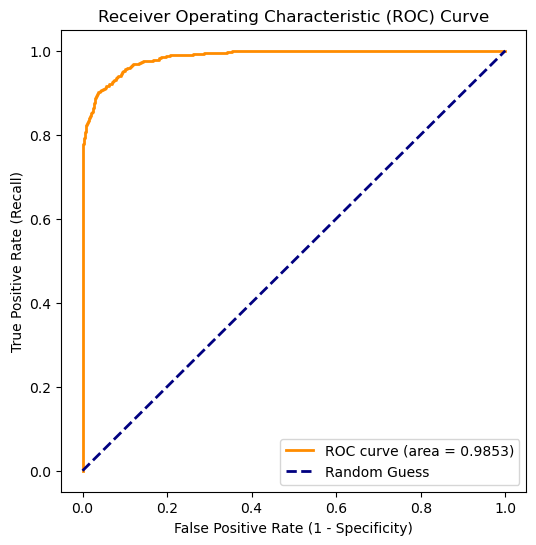

In [136]:
from sklearn.metrics import (accuracy_score, precision_score, recall_score, roc_auc_score, f1_score, roc_curve)

y_pred_proba = model.predict_proba(x_test)[:, 1] 

accuracy = accuracy_score(y_test, y_test_pred) 
precision = precision_score(y_test, y_test_pred)   
recall = recall_score(y_test, y_test_pred)  
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

print("\n--- DETAILED CLASSIFICATION METRICS ---")
print(f"1. Accuracy:   {accuracy:.4f}")
print(f"2. Precision:  {precision:.4f}")
print(f"3. Recall:     {recall:.4f}")
print(f"4. F1 Score:   {f1:.4f}")
print(f"5. ROC AUC:    {roc_auc:.4f}")
print("-" * 40)


# ---  PLOT ROC CURVE ---
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

#

## Random Forest Model

In [142]:
rf_params = {'n_estimators': 700, 'max_depth': 30, 'min_samples_split': 8, 'min_samples_leaf': 10, 'max_features': 1.0, 'bootstrap': True}

final_rf_model = RandomForestClassifier(**rf_params, random_state=42, n_jobs=-1)
final_rf_model.fit(x_train, y_train)

RandomForestClassifier(max_depth=30, max_features=1.0, min_samples_leaf=10,
                       min_samples_split=8, n_estimators=700, n_jobs=-1,
                       random_state=42)

In [143]:
training_data_accuracy = accuracy_score(y_train, x_train_pred)
print(f'training accuracy: {training_data_accuracy}')

training accuracy: 0.9620689655172414


In [144]:
y_test_pred = final_rf_model.predict(x_test)
testing_accuracy = accuracy_score(y_test, y_test_pred) 

print(f'Testing data Accuracy: {testing_accuracy}')

Testing data Accuracy: 0.9441552295314718


Generating probability scores for ROC AUC...

--- DETAILED CLASSIFICATION METRICS (Final Model) ---
1. Accuracy:   0.9442
2. Precision:  0.9486
3. Recall:     0.8455
4. F1 Score:   0.8941
5. ROC AUC:    0.9857
----------------------------------------


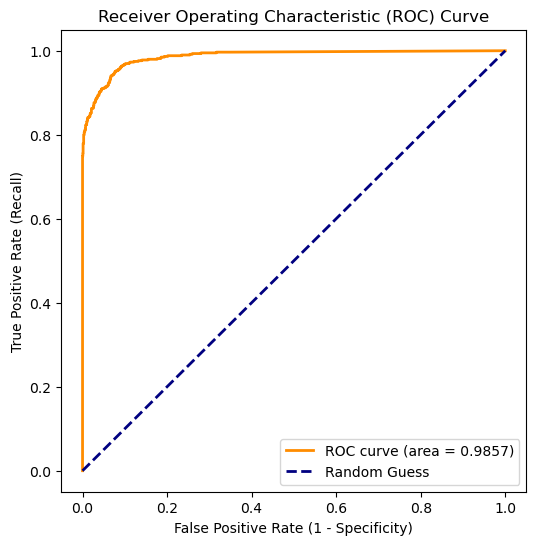

In [138]:
y_pred = final_rf_model.predict(x_test) 

print("Generating probability scores for ROC AUC...")
# We take the probabilities for the positive class (index 1)
y_pred_proba = final_rf_model.predict_proba(x_test)[:, 1] 


# --- CALCULATE ALL METRICS ---
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

# ---  PRINT RESULTS ---
print("\n--- DETAILED CLASSIFICATION METRICS (Final Model) ---")
print(f"1. Accuracy:   {accuracy:.4f}")
print(f"2. Precision:  {precision:.4f}")
print(f"3. Recall:     {recall:.4f}")
print(f"4. F1 Score:   {f1:.4f}")
print(f"5. ROC AUC:    {roc_auc:.4f}")
print("-" * 40)


# ---  PLOT ROC CURVE ---
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [388]:
# prediction and evaluation on testing data
y_pred = final_rf_model.predict(x_test)

y_pred_proba = final_rf_model.predict_proba(x_test)[:, 1]

In [390]:
# Metrics Calculation
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

In [392]:
# Model Performance on Unseen data
print(f'1. Accuracy: {accuracy: .4f}')
print(f'2. Precision: {precision : .4f}')
print(f'3. Recall: {recall: .4f}')
print(f'4. ROC AUC: {roc_auc: .4f}')
print("-" * 50)

1. Accuracy:  0.9527
2. Precision:  0.9536
3. Recall:  0.8727
4. ROC AUC:  0.9869
--------------------------------------------------


## --- FINAL PROJECT SUMMARY AND INSIGHT ---

### This project successfully addressed severe data quality issues to build a highly predictive Random Forest model.

#### 1. DATA CLEANING SUCCESS:
     - Data Leakage: We eliminated the 100% accurate leak (e.g., Churn_Score) and the functional duplicate (Customer_Status).
     - Feature Engineering: Zero-inflated columns were converted to robust flag/bin features.
#
#### 2. VIF STABILIZATION:
     - High multicollinearity was resolved by systematically dropping features causing redundancy (Total_Charges, Total_Revenue_log, Monthly_Charge) while retaining  
       the strongest predictors: tenure_m and Monthly_Charge (in earlier steps).
# 
#### 3. MODEL PERFORMANCE:
     - The optimized Random Forest achieved an **AUC of 0.9853** and a Test Accuracy of 0.9432, The small gap between training and testing accuracy (0.95 vs 0.94) proves the model is stable and 
       generalizes excellently to new, unseen data.